## nTracks
Comparison of discrimination capability of `nTracks` variable associated to each event, versus the CoDAE models and the supervised classifier.
* `nTracks`: Corresponds to the total number of tracks that generate an event in the inner tracker channel, this should be more discriminative compared to discretizing the detector resolution since it possible to have multiple tracks in the same pixel.

In [1]:
import os
import numpy as np
import tensorflow as tf

In [3]:
import ad

from ad import utils

In [4]:
utils.set_random_seed(42)
ad.plot.set_style(default_cmap=ad.plot.CMAP2)

Random seed 42 set.


In [5]:
%load_ext autoreload
%autoreload 2

Approx. sparsity of original dataset

In [10]:
import h5py

path = 'data/n_tracks/qcd'
files = os.listdir(path)
i = np.random.choice(len(files))

filepath = os.path.join(path, files[i])
print(filepath)

with h5py.File(filepath, 'r') as file:
    dtype = np.float32
    image_trk = np.array(file.get('ImageTrk_PUcorr'), dtype=dtype)

    # ECAL image
    image_ecal = np.array(file.get('ImageECAL'), dtype=dtype)

    # HCAL image
    image_hcal = np.array(file.get('ImageHCAL'), dtype=dtype)

    # stack the three images to form 3-channel images
    # shape: (N, 286, 360, 3)
    images = np.stack([image_trk, image_ecal, image_hcal], axis=-1).astype(dtype)

all_pixels = np.prod(images.shape).astype(np.float32)
ones_pixels = np.sum((images > 0).astype(bool)).astype(np.float32)
sparsity = (all_pixels - ones_pixels) / all_pixels
sparsity

../data/n_tracks/qcd\qcd_gensim_135_8.h5


0.99452925

#### Discrimination of nTracks variable

In [6]:
def load_test_data(base_path: str) -> dict:
    """Returns the nTracks variable associated to each class"""
    # QCD + signals (SUEPs + SVJs)
    x_test = utils.read_npz(folder=os.path.join(base_path, 'test'), dtype=np.float32,
                           verbose=False, keys=['n_tracks', 'images', 'labels', 'masses'])
    return x_test


In [7]:
data = load_test_data(base_path='data/n_tracks')
data['n_tracks'].shape

(343769, 1)

In [13]:
# approx image sparsity
indices = np.random.choice(len(data['images']), size=1024, replace=False)
x = data['images'][indices]

ones_pixels = np.sum(x > 0.0, axis=(1, 2, 3))
all_pixels = np.prod(x.shape[1:])

sparsity = (all_pixels - ones_pixels) / all_pixels
sparsity *= 100.0
np.mean(sparsity), np.std(sparsity)

(96.80131349527059, 0.9750906797615246)

In [8]:
x_mask = (data['images'][..., 0, np.newaxis] > 0.0).astype(np.float32)
y_test = data['labels']
m_test = data['masses']

In [9]:
for y in np.unique(y_test):
    print(utils.get_name(label=y), np.sum(y_test == y))

QCD 170152
SUEP 67142
SVJ 106475


QCD (0) #170152


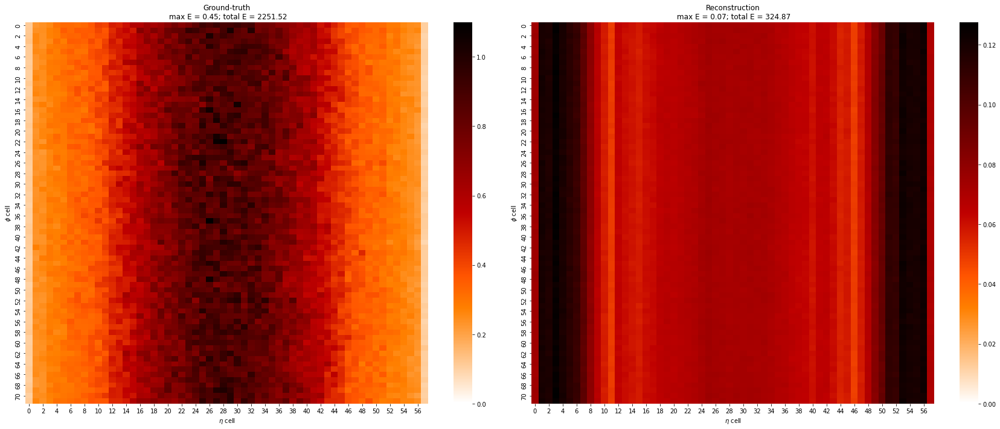

SUEP (125) #4124


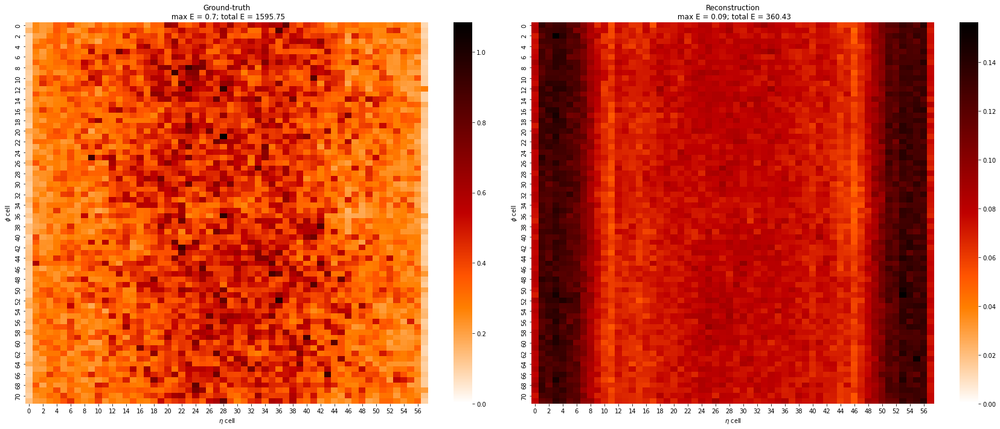

SUEP (200) #3994


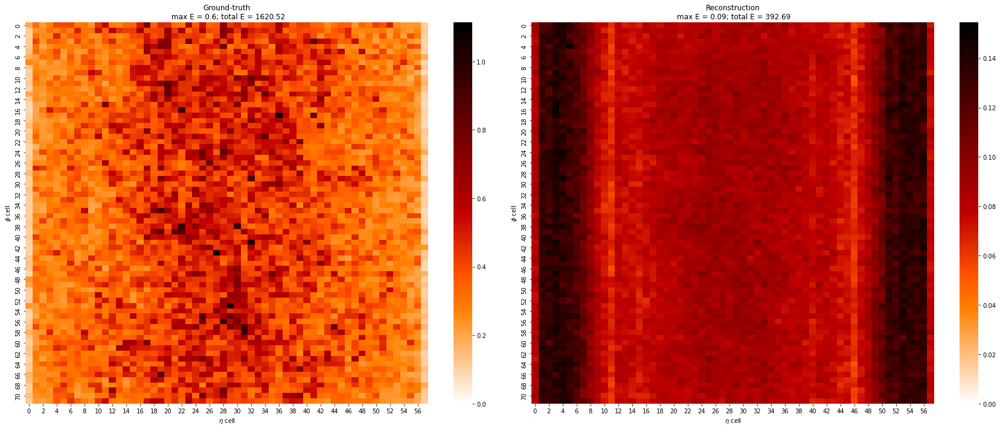

SUEP (300) #7095


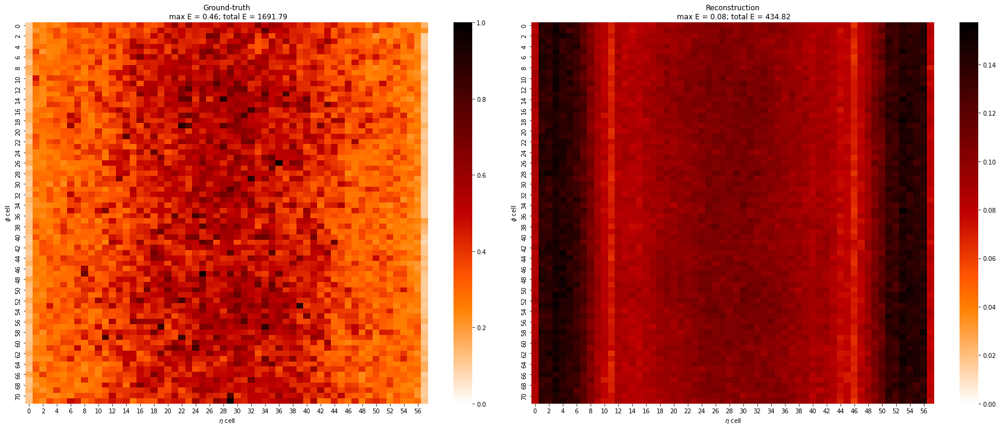

SUEP (400) #10173


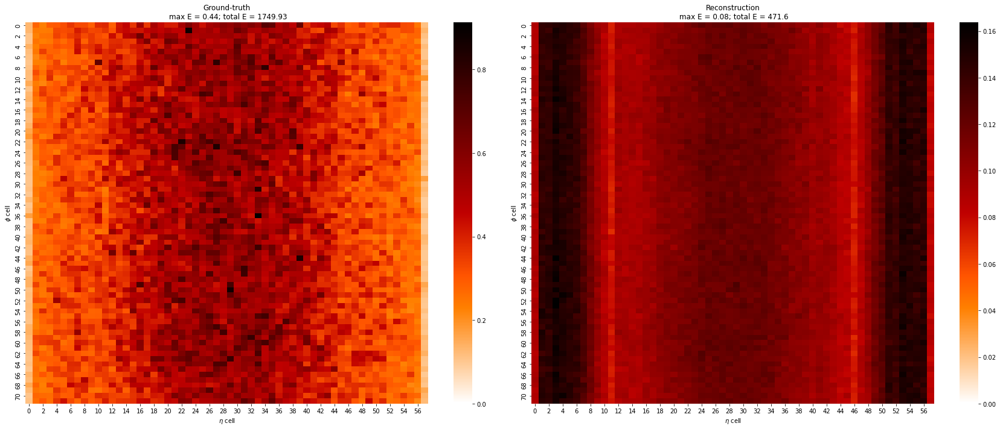

SUEP (700) #46122


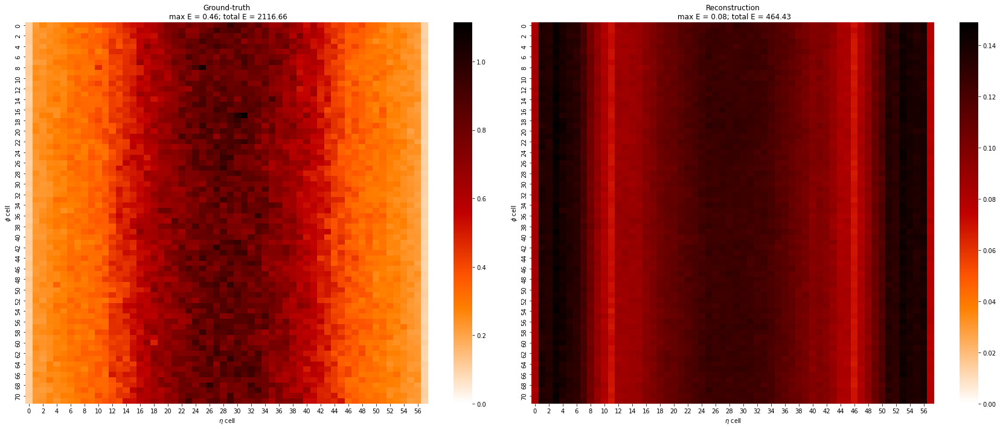

SUEP (1000) #63466


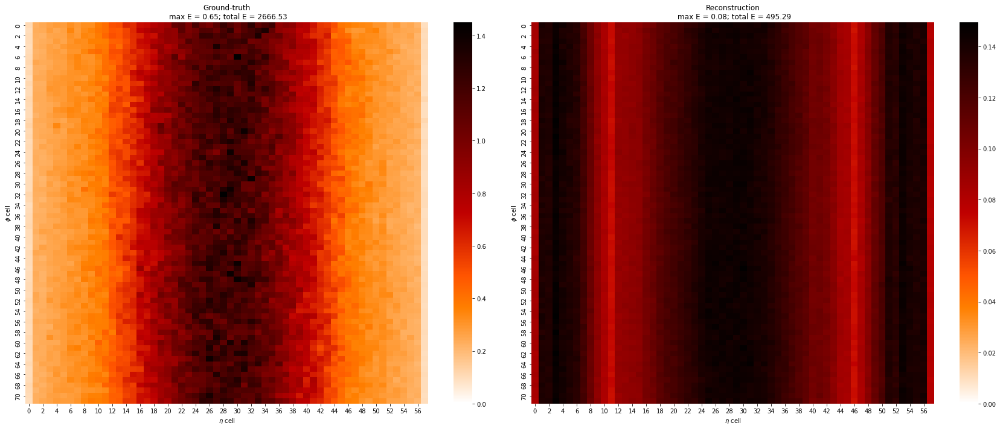

SVJ (4.1) #38643


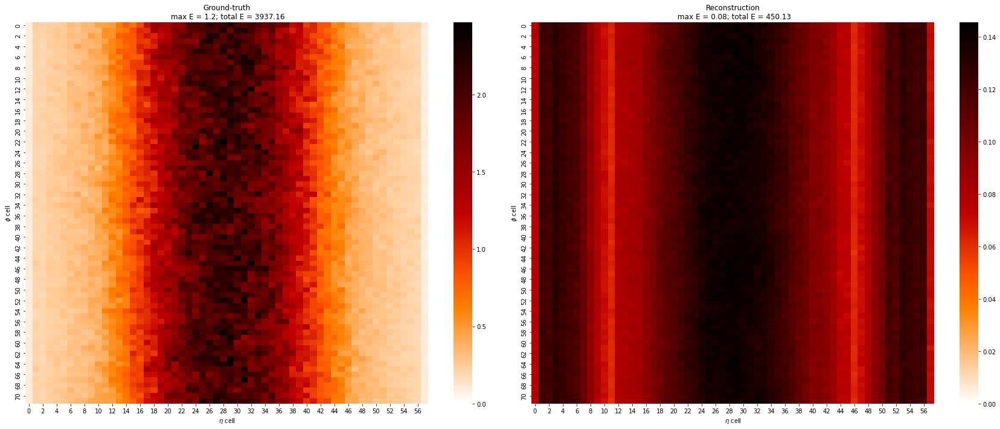

In [10]:
for m in np.unique(m_test):
    mask = m_test == m

    x = data['images'][mask]
    y = utils.get_label_from(mass_idx=m)

    print(f'{utils.get_name(label=y)} ({utils.get_mass(label=y, mass_idx=m)}) #{mask.sum()}')
    ad.plot.compare(x.mean(0), (x > 0).mean(0), v_max=None)

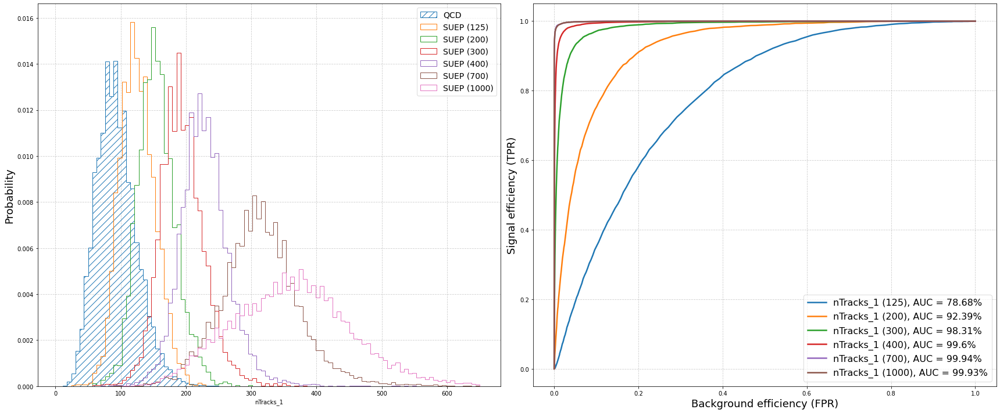

[nTracks_1] Avg: 94.81%, AUC: [78.68 92.39 98.31 99.6  99.94 99.93]
[nTracks_1] Avg: 2.5%, FPR@40: [11.8338, 2.8487, 0.2769, 0.0285, 0.0, 0.0]


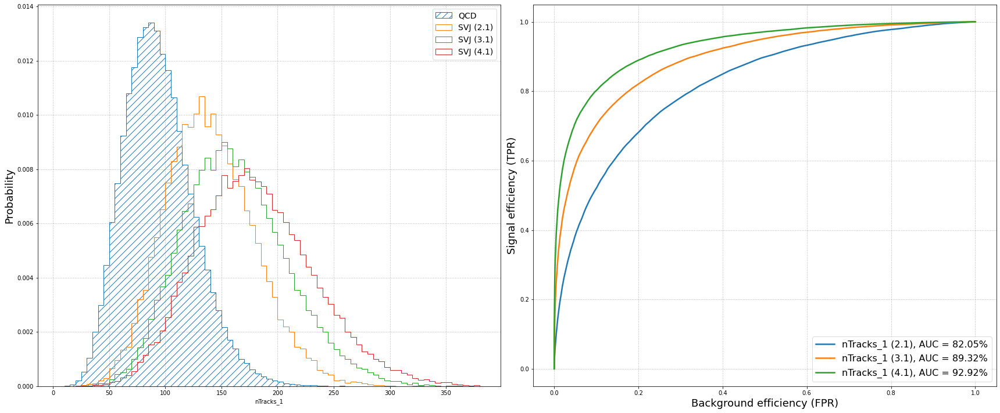

[nTracks_1] Avg: 88.1%, AUC: [82.05 89.32 92.92]
[nTracks_1] Avg: 2.53%, FPR@40: [5.4498, 1.5985, 0.5392]


In [9]:
tracks = ad.eval2.latents_as_scores({'nTracks': data['n_tracks']}, y=data['labels'],
                                    masses=data['masses'])

roc1 = ad.plot.roc_per_mass(bkg_scores=tracks['qcd'], signal_scores=tracks['suep'],
                            x_limits={'nTracks_1': (0, 650)})
ad.eval2.print_by_auc(roc1)
ad.eval2.print_fpr_at_n_tpr(roc1)

roc2 = ad.plot.roc_per_mass(bkg_scores=tracks['qcd'], signal_scores=tracks['svj'], bins=75,
                            x_limits={'nTracks_1': (0, 380)})
ad.eval2.print_by_auc(roc2)
ad.eval2.print_fpr_at_n_tpr(roc2)

Total Energy baseline

In [9]:
total_energy = np.sum(data['images'], axis=(1, 2))
total_energy_sum = np.sum(total_energy, axis=-1, keepdims=True)
total_energy.shape, total_energy_sum.shape

((343769, 3), (343769, 1))

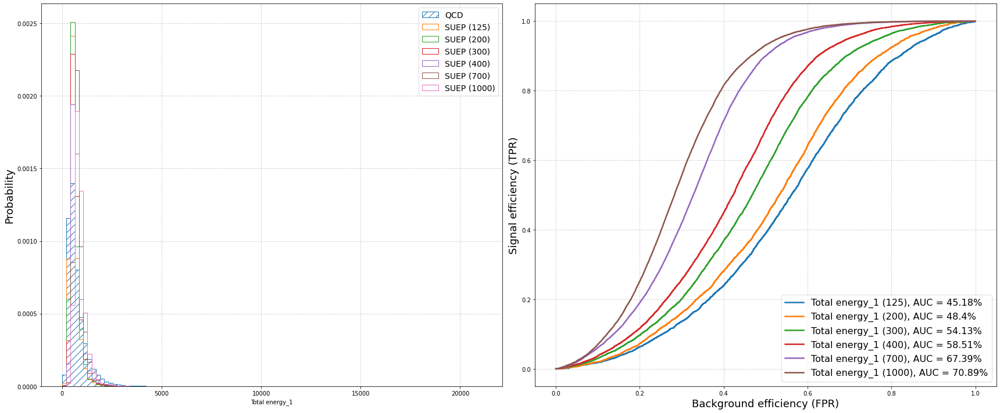

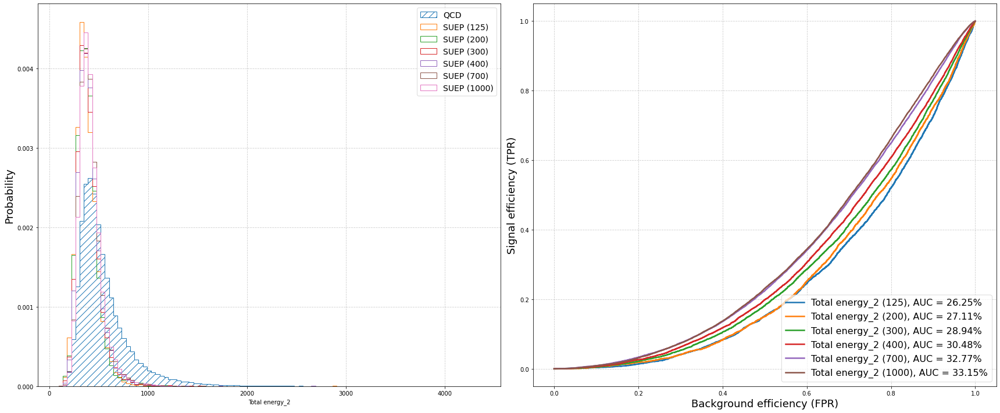

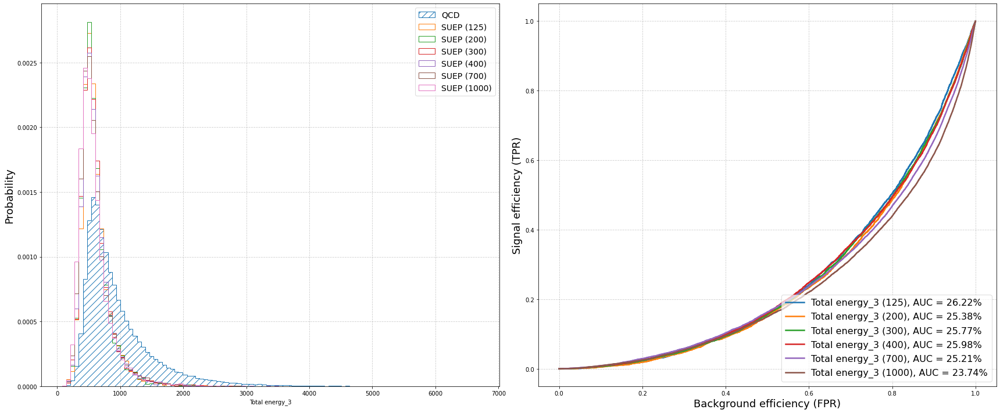

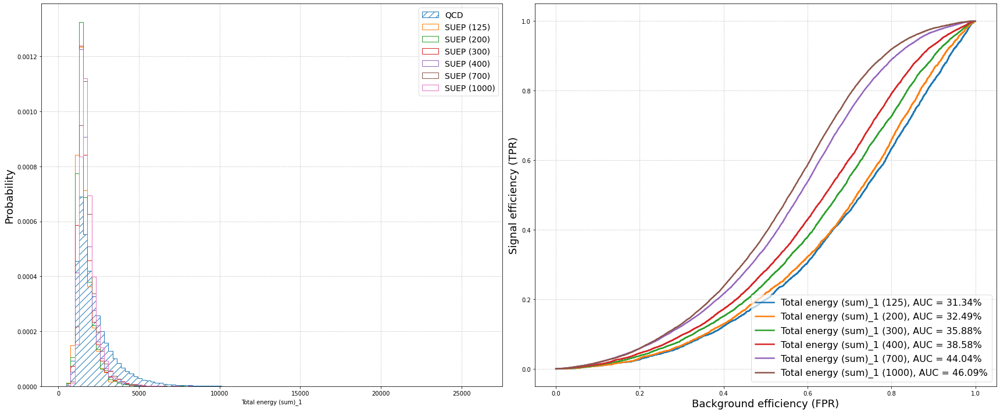

[Total energy_1]       Avg: 57.42%, AUC: [45.18 48.4  54.13 58.51 67.39 70.89]
[Total energy (sum)_1] Avg: 38.07%, AUC: [31.34 32.49 35.88 38.58 44.04 46.09]
[Total energy_2]       Avg: 29.78%, AUC: [26.25 27.11 28.94 30.48 32.77 33.15]
[Total energy_3]       Avg: 25.38%, AUC: [26.22 25.38 25.77 25.98 25.21 23.74]
[Total energy_1]       Avg: 38.78%, FPR@40: [50.63, 48.1087, 41.812, 37.7145, 29.2997, 25.1146]
[Total energy (sum)_1] Avg: 59.13%, FPR@40: [66.0333, 65.7694, 61.3487, 58.205, 52.8792, 50.5366]
[Total energy_2]       Avg: 67.99%, FPR@40: [72.397, 70.9266, 69.09, 66.9237, 64.3901, 64.2049]
[Total energy_3]       Avg: 74.52%, FPR@40: [73.1946, 74.4387, 73.566, 73.5701, 75.3138, 77.0394]


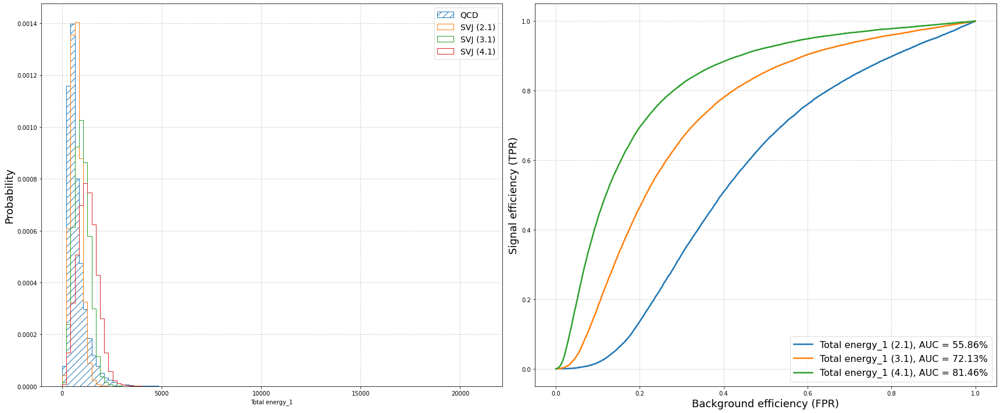

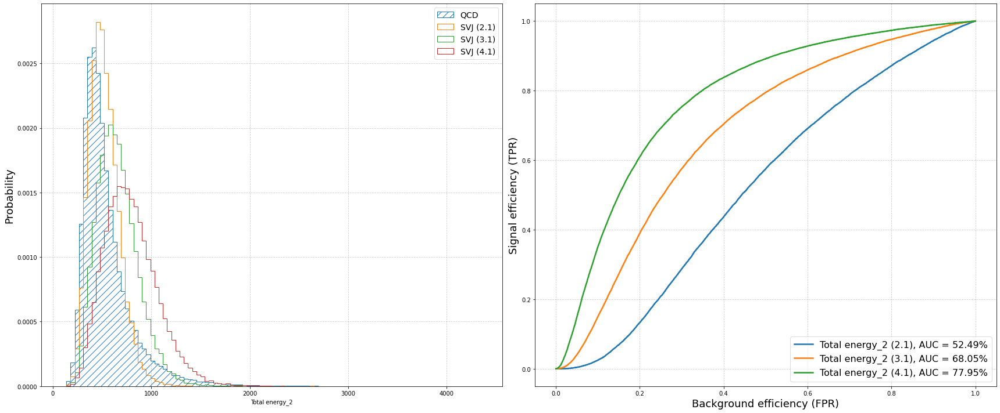

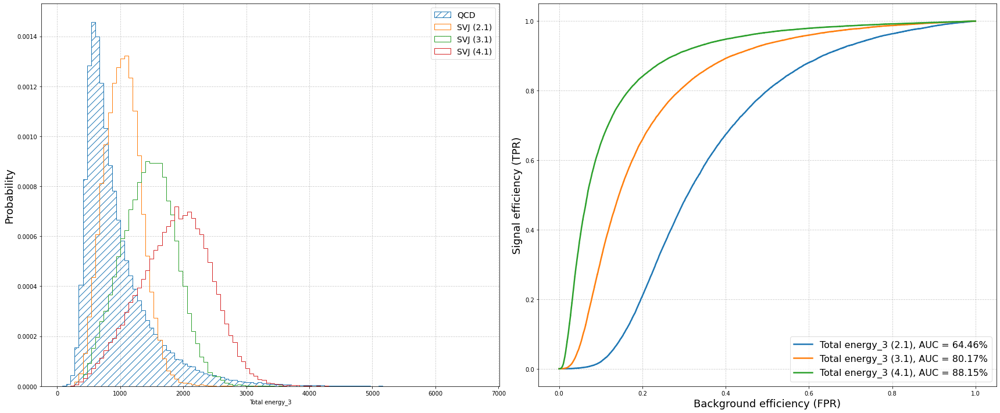

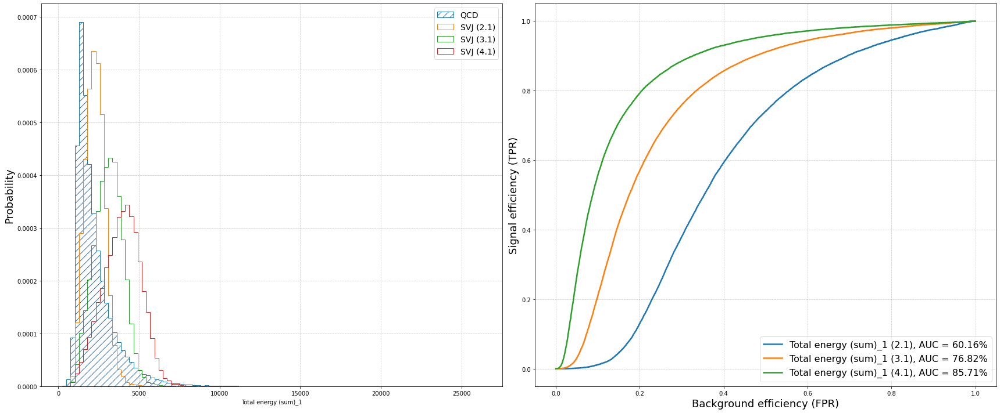

[Total energy_3]       Avg: 77.59%, AUC: [64.46 80.17 88.15]
[Total energy (sum)_1] Avg: 74.23%, AUC: [60.16 76.82 85.71]
[Total energy_1]       Avg: 69.82%, AUC: [55.86 72.13 81.46]
[Total energy_2]       Avg: 66.16%, AUC: [52.49 68.05 77.95]
[Total energy_3]       Avg: 14.66%, FPR@40: [26.8066, 11.8694, 5.2988]
[Total energy (sum)_1] Avg: 17.42%, FPR@40: [30.8177, 14.5006, 6.9391]
[Total energy_1]       Avg: 20.15%, FPR@40: [33.8362, 17.4614, 9.1553]
[Total energy_2]       Avg: 23.1%, FPR@40: [37.3584, 20.4276, 11.5097]


In [10]:
energy = ad.eval2.latents_as_scores({'Total energy': total_energy,
                                     'Total energy (sum)': total_energy_sum}, y=y_test,
                                    masses=m_test)

roc1 = ad.plot.roc_per_mass(bkg_scores=energy['qcd'], signal_scores=energy['suep'],
                            x_limits=None)
ad.eval2.print_by_auc(roc1)
ad.eval2.print_fpr_at_n_tpr(roc1)

roc2 = ad.plot.roc_per_mass(bkg_scores=energy['qcd'], signal_scores=energy['svj'], bins=100,
                            x_limits=None)
ad.eval2.print_by_auc(roc2)
ad.eval2.print_fpr_at_n_tpr(roc2)

### V/AE Evaluation

In [10]:
from ad.models.dual_ae import CoDAE
from ad.models.vae import COD2VAE

Conditional Dual-AE (CoDAE)

In [11]:
model = CoDAE(image_shape=(72, 58, 1), latent_size=64,
              encoder1=dict(depths=(1, 1, 1, 1), filters=[64, 128, 128, 256],
                            groups=4),
              encoder2=dict(filters=[64, 128, 128, 256], groups=2),
              decoder=dict(filters=[256, 128, 128, 64], depths=(1, 1, 1, 1),
                           bias=-1.0, groups=4))

utils.load_from_checkpoint(model, path='codae', mode='max')

Loaded from "weights\codae\weights-30-0.873"


In [8]:
model.summary()

Model: "Res-Encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 72, 58, 1)]  0           []                               
                                                                                                  
 dconv-b0 (ConvLayer)           (None, 36, 29, 64)   768         ['image[0][0]']                  
                                                                                                  
 conv1-b0_0 (ConvLayer)         (None, 36, 29, 64)   9408        ['dconv-b0[0][0]']               
                                                                                                  
 conv2-b0_0 (ConvLayer)         (None, 36, 29, 64)   9408        ['conv1-b0_0[0][0]']             
                                                                                        

In [ ]:
z = model.encoder2.predict(x_mask, batch_size=256)
z_l2 = tf.math.l2_normalize(z, axis=-1).numpy()

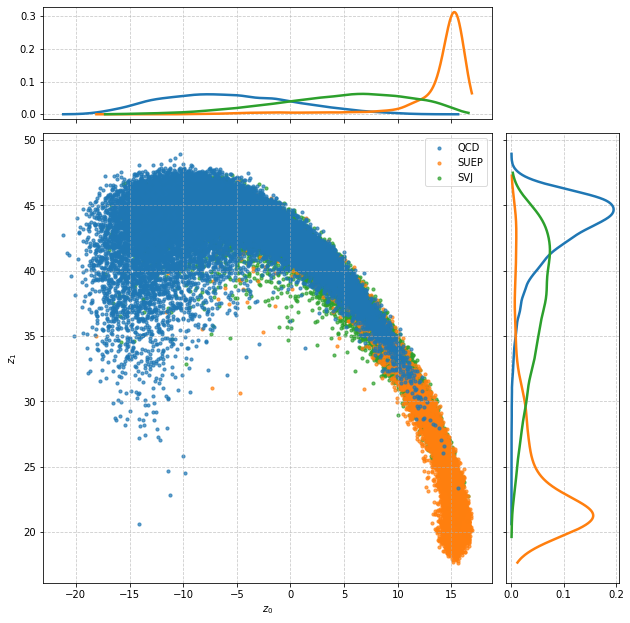

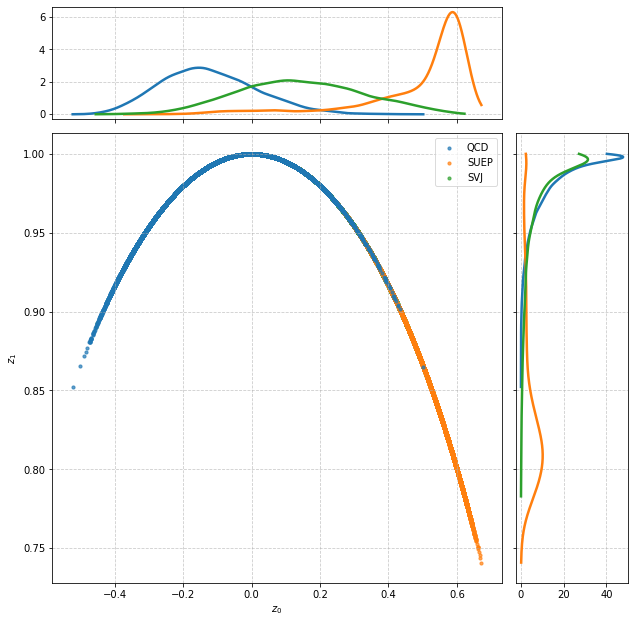

In [14]:
ad.plot.latent_kde(z, y=y_test)
ad.plot.latent_kde(z_l2, y=y_test)

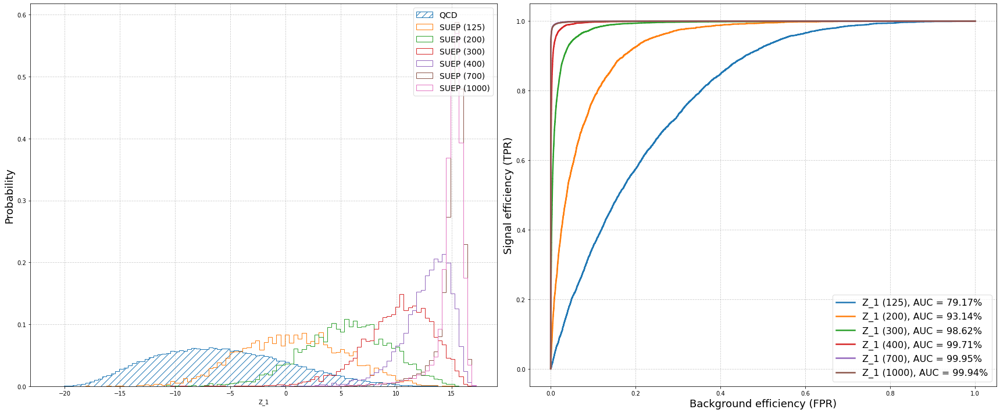

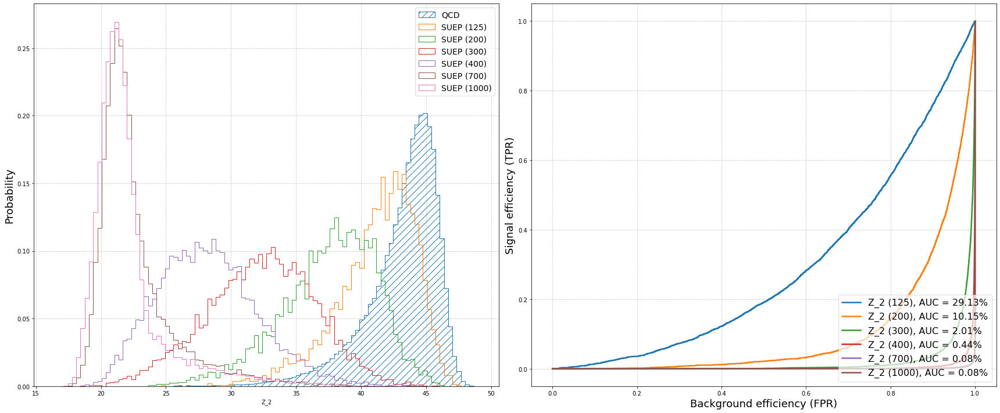

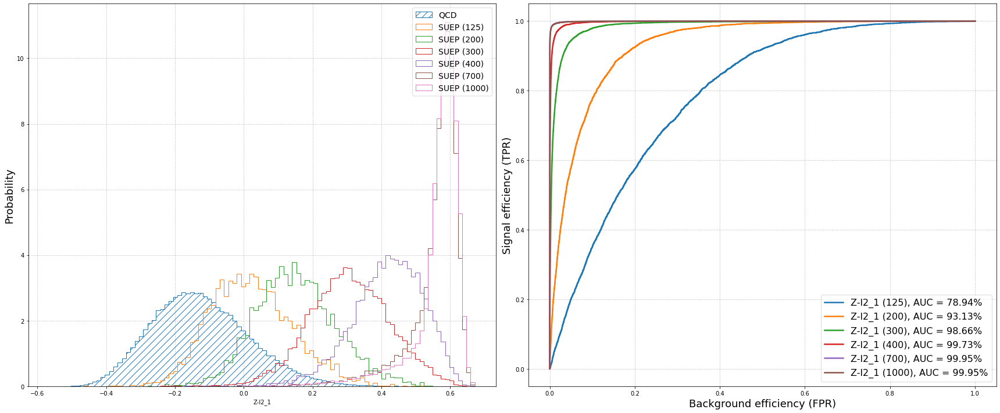

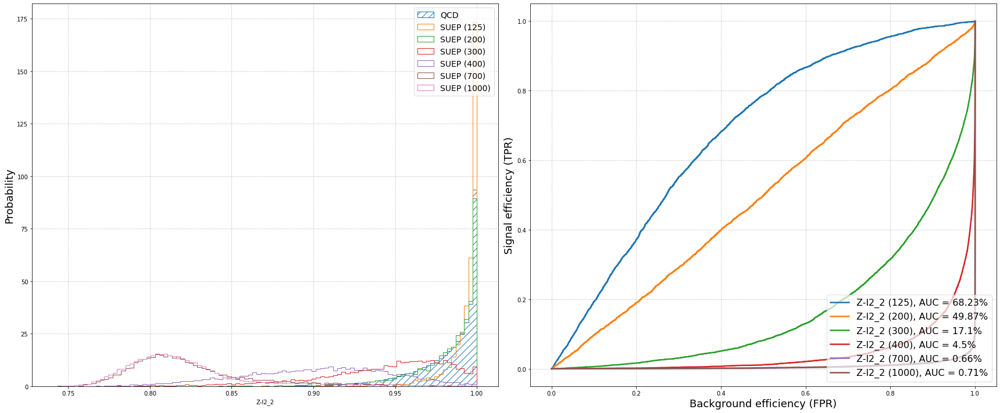

[Z_1]    Avg: 95.09%, AUC: [79.17 93.14 98.62 99.71 99.95 99.94]
[Z-l2_1] Avg: 95.06%, AUC: [78.94 93.13 98.66 99.73 99.95 99.95]
[Z-l2_2] Avg: 23.51%, AUC: [68.23 49.87 17.1   4.5   0.66  0.71]
[Z_2]    Avg: 6.98%, AUC: [29.13 10.15  2.01  0.44  0.08  0.08]
[Z-l2_1] Avg: 2.45%, FPR@40: [11.9957, 2.4948, 0.2069, 0.0141, 0.0, 0.0]
[Z_1]    Avg: 2.46%, FPR@40: [11.9499, 2.5354, 0.228, 0.0217, 0.0006, 0.0006]
[Z-l2_2] Avg: 74.32%, FPR@40: [21.4179, 40.0777, 85.6234, 98.8064, 100.0, 100.0]
[Z_2]    Avg: 93.43%, FPR@40: [69.9551, 91.7109, 99.0532, 99.8907, 99.9971, 99.9976]


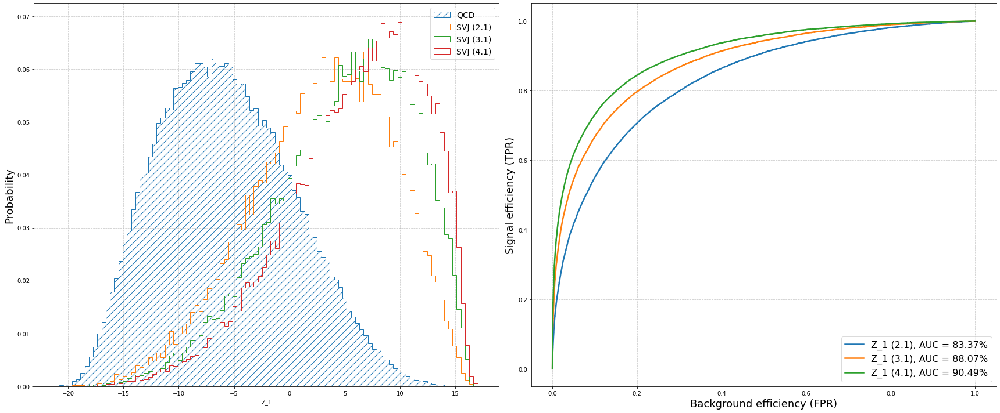

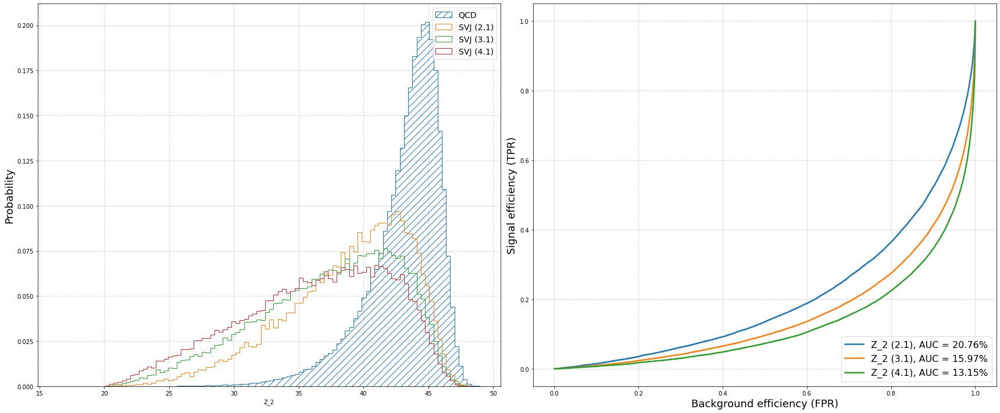

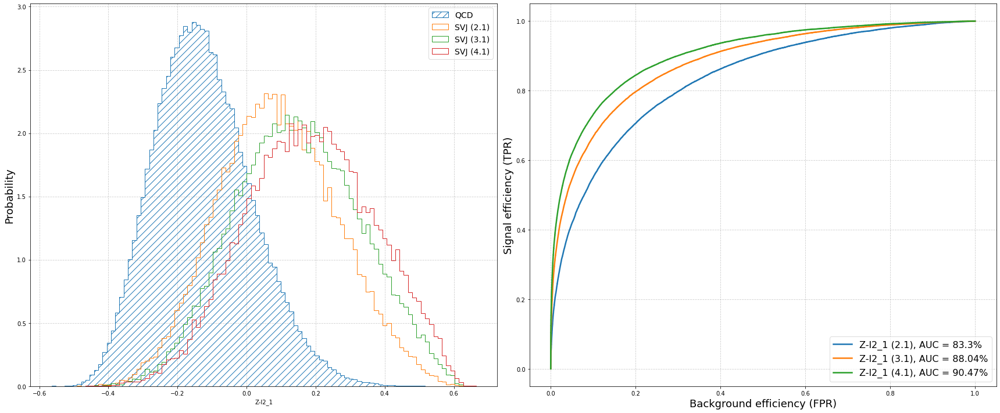

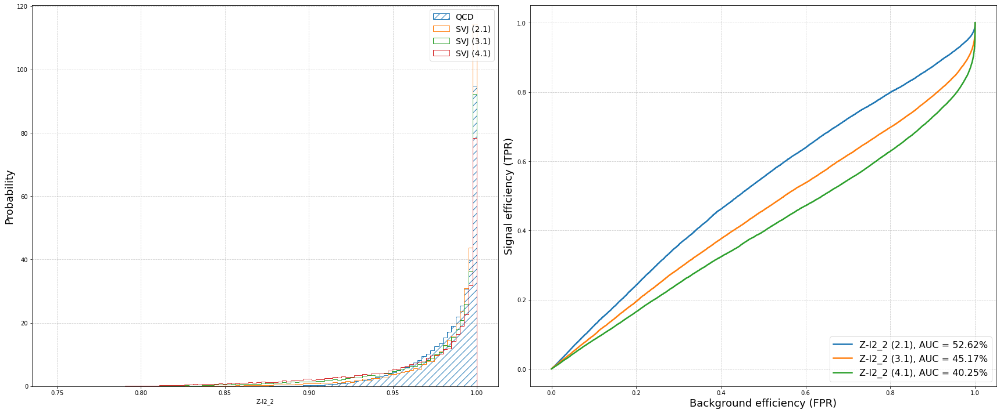

[Z_1]    Avg: 87.31%, AUC: [83.37 88.07 90.49]
[Z-l2_1] Avg: 87.27%, AUC: [83.3  88.04 90.47]
[Z-l2_2] Avg: 46.01%, AUC: [52.62 45.17 40.25]
[Z_2]    Avg: 16.62%, AUC: [20.76 15.97 13.15]
[Z-l2_1] Avg: 2.5%, FPR@40: [4.4484, 1.953, 1.102]
[Z_1]    Avg: 2.56%, FPR@40: [4.5412, 1.9882, 1.1443]
[Z-l2_2] Avg: 42.45%, FPR@40: [34.0008, 42.9387, 50.3996]
[Z_2]    Avg: 88.25%, FPR@40: [82.6291, 89.316, 92.8041]


In [13]:
scores = ad.eval2.latents_as_scores({'Z': z, 'Z-l2': z_l2}, y=y_test, masses=m_test)

roc = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['suep'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

roc = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['svj'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

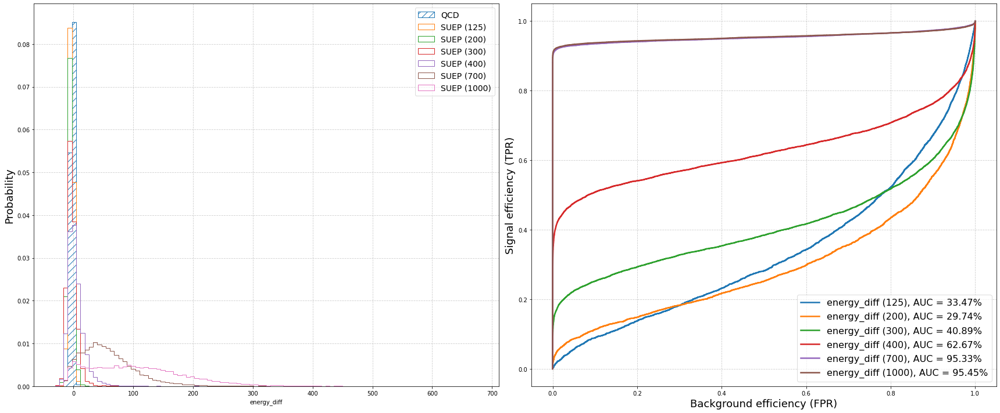

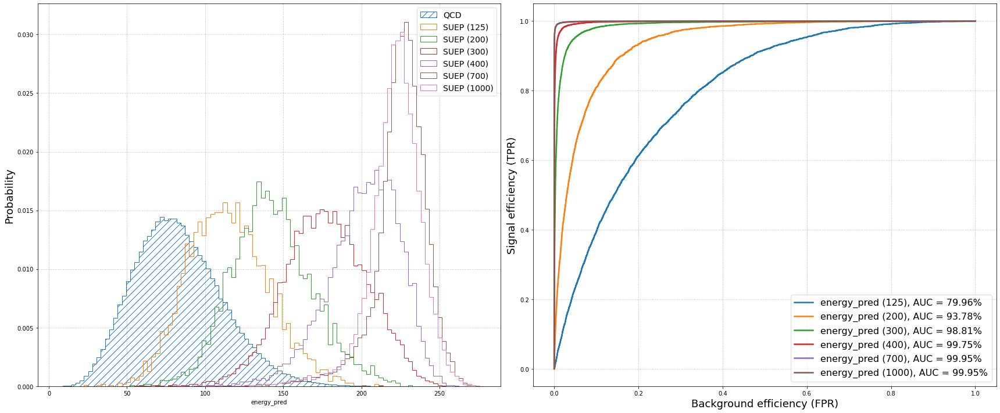

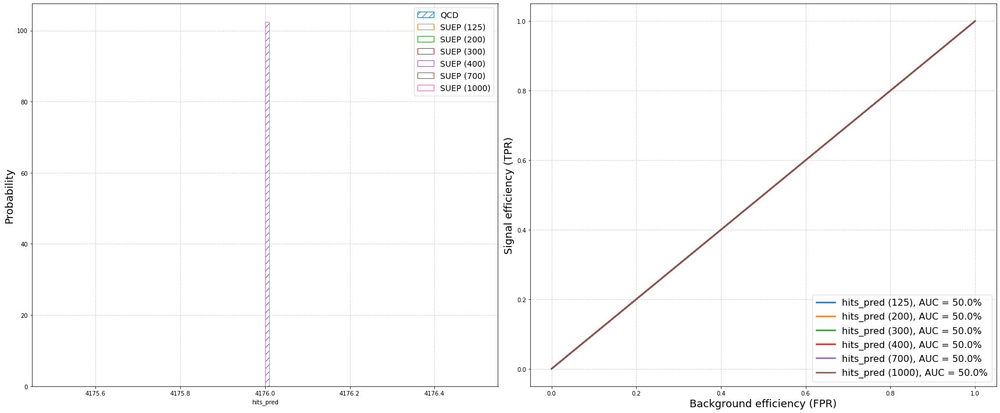

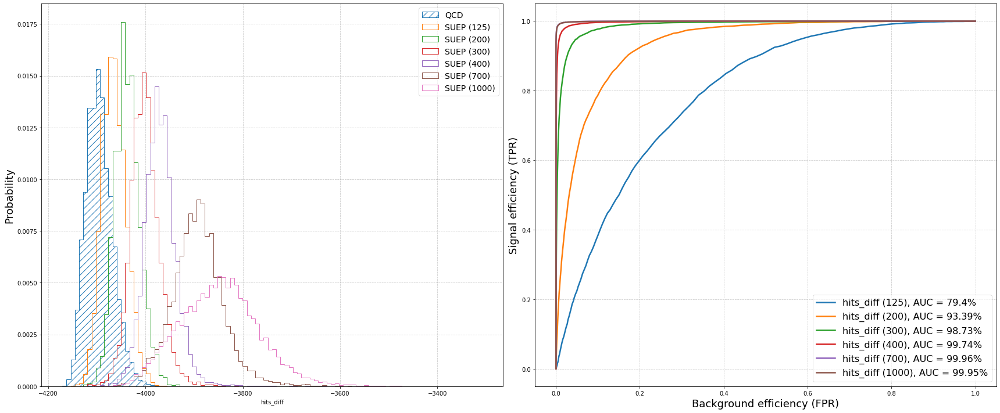

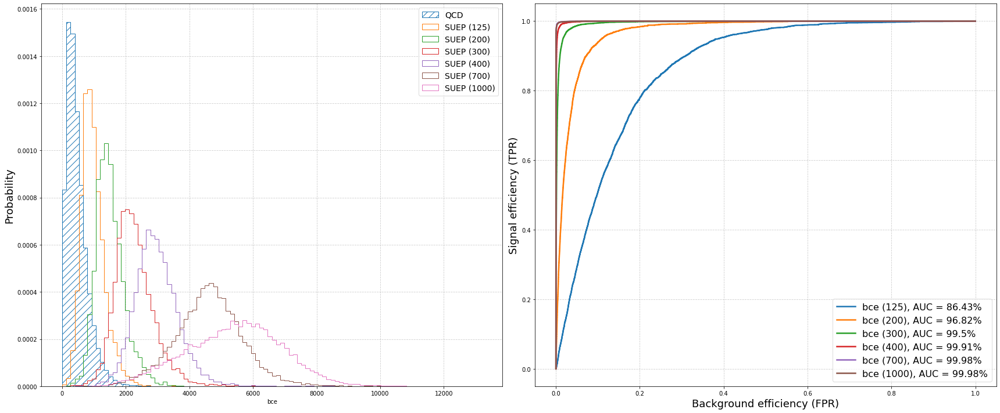

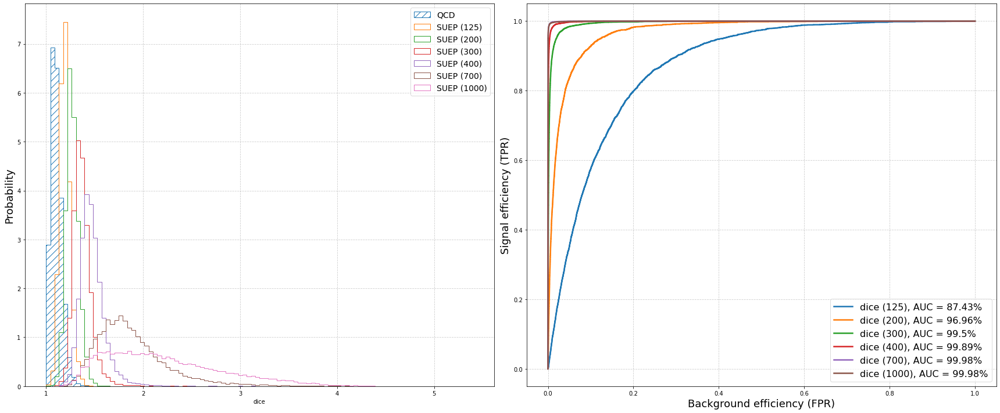

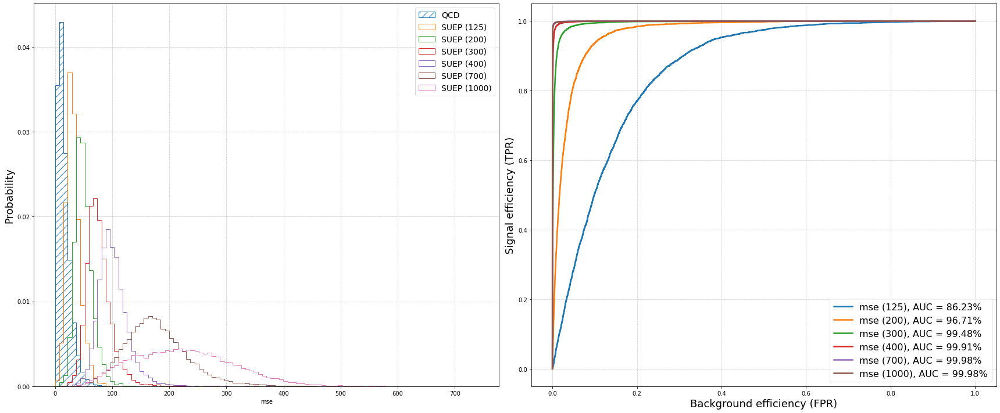

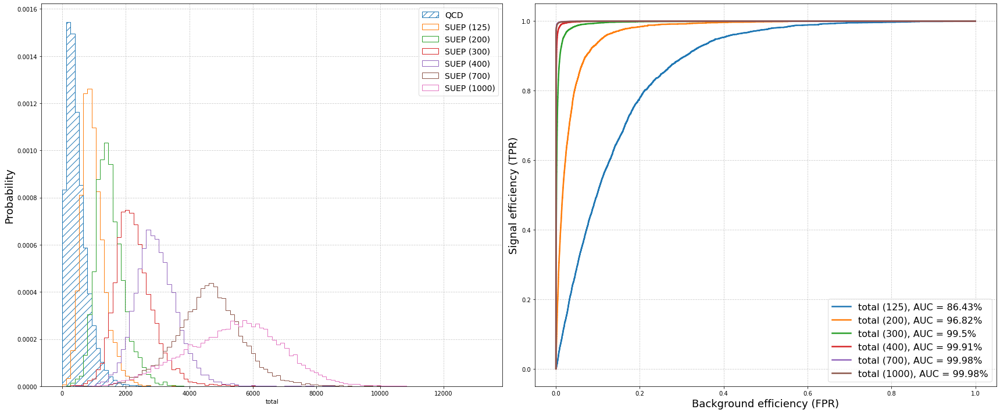

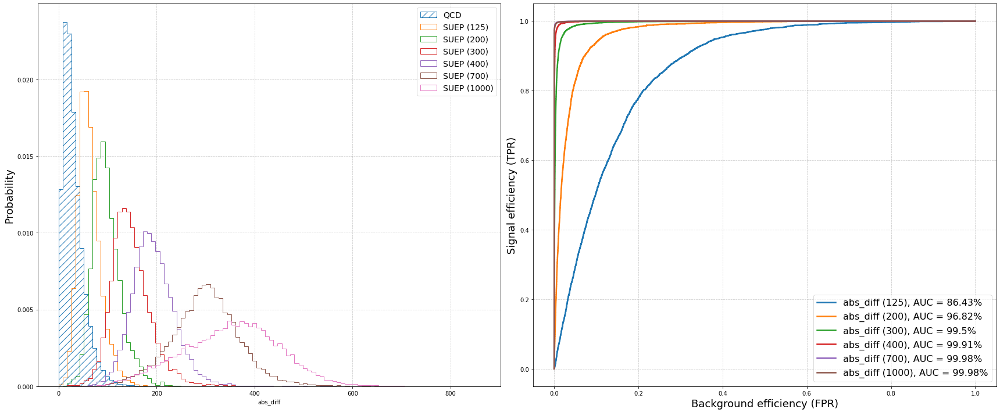

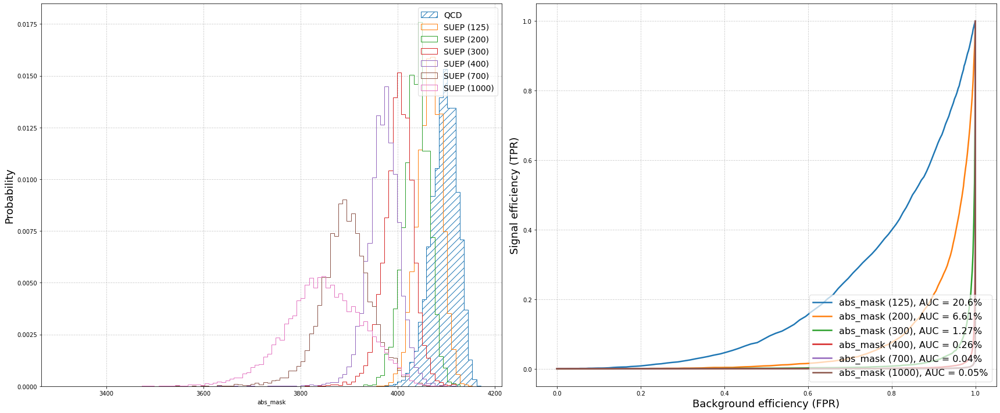

[dice]        Avg: 97.29%, AUC: [87.43 96.96 99.5  99.89 99.98 99.98]
[total]       Avg: 97.1%, AUC: [86.43 96.82 99.5  99.91 99.98 99.98]
[abs_diff]    Avg: 97.1%, AUC: [86.43 96.82 99.5  99.91 99.98 99.98]
[bce]         Avg: 97.1%, AUC: [86.43 96.82 99.5  99.91 99.98 99.98]
[mse]         Avg: 97.05%, AUC: [86.23 96.71 99.48 99.91 99.98 99.98]
[energy_pred] Avg: 95.37%, AUC: [79.96 93.78 98.81 99.75 99.95 99.95]
[hits_diff]   Avg: 95.19%, AUC: [79.4  93.39 98.73 99.74 99.96 99.95]
[energy_diff] Avg: 59.59%, AUC: [33.47 29.74 40.89 62.67 95.33 95.45]
[hits_pred]   Avg: 50.0%, AUC: [50. 50. 50. 50. 50. 50.]
[abs_mask]    Avg: 4.81%, AUC: [20.6   6.61  1.27  0.26  0.04  0.05]
[dice]        Avg: 1.11%, FPR@40: [5.8371, 0.764, 0.0635, 0.0035, 0.0, 0.0]
[total]       Avg: 1.41%, FPR@40: [7.2917, 1.1078, 0.0776, 0.0041, 0.0, 0.0]
[bce]         Avg: 1.41%, FPR@40: [7.2917, 1.1084, 0.0776, 0.0041, 0.0, 0.0]
[abs_diff]    Avg: 1.41%, FPR@40: [7.2905, 1.1102, 0.0776, 0.0041, 0.0, 0.0]
[mse]     

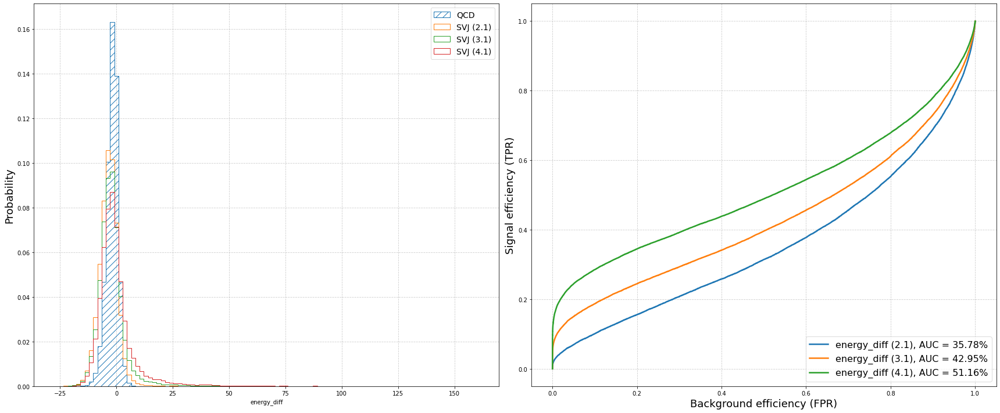

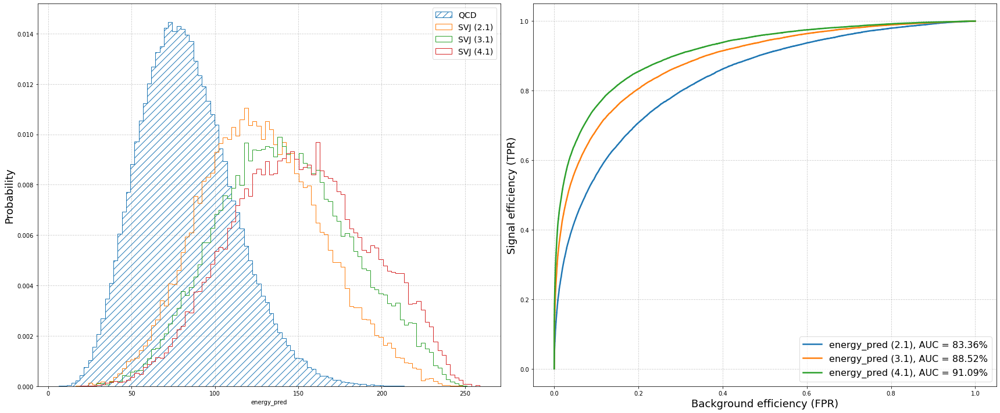

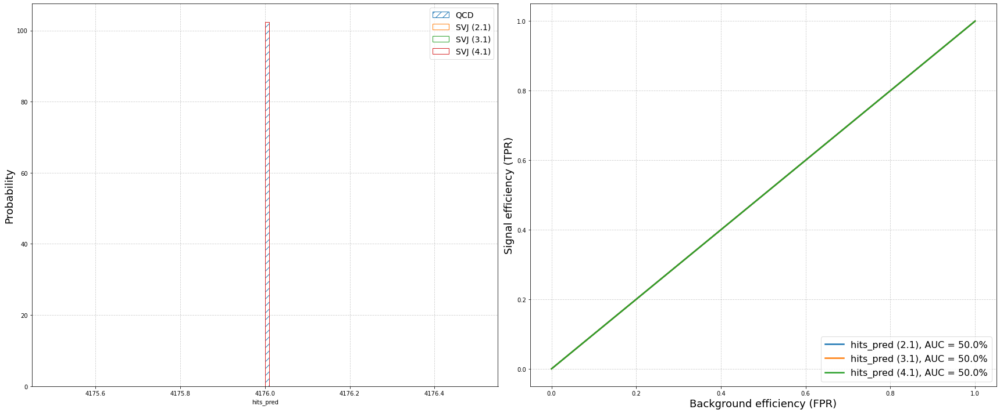

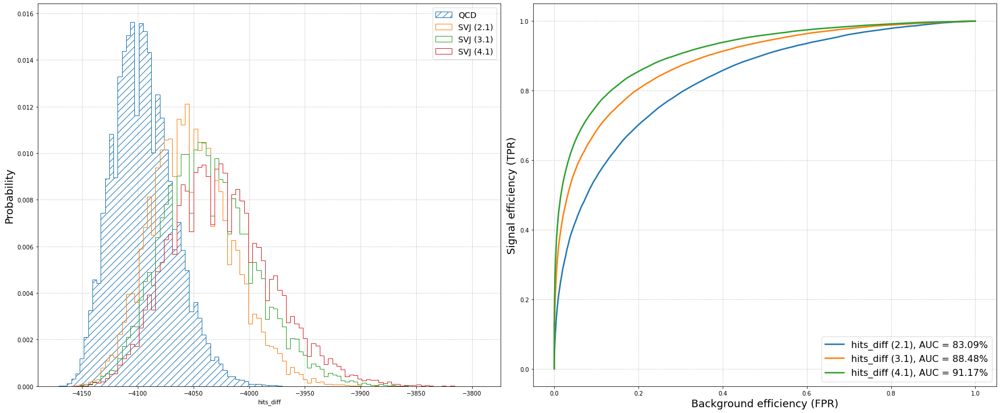

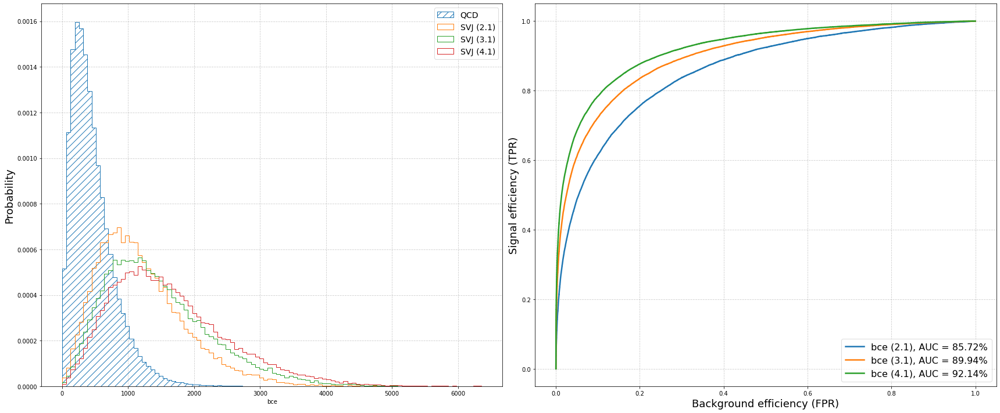

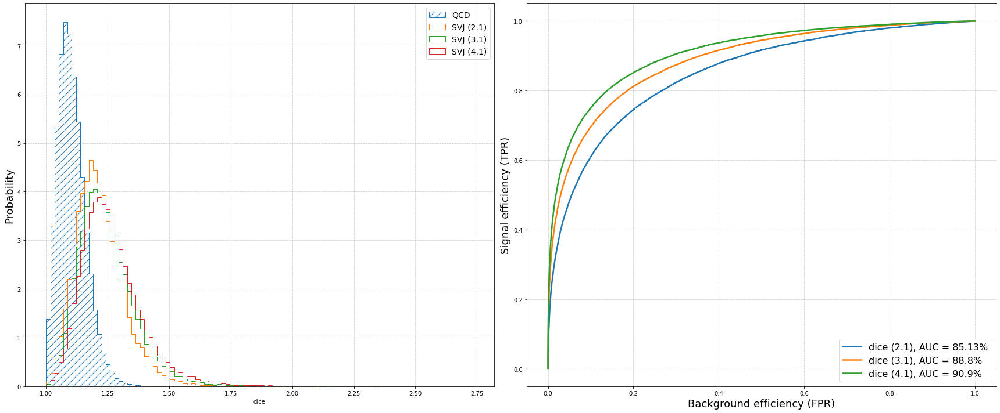

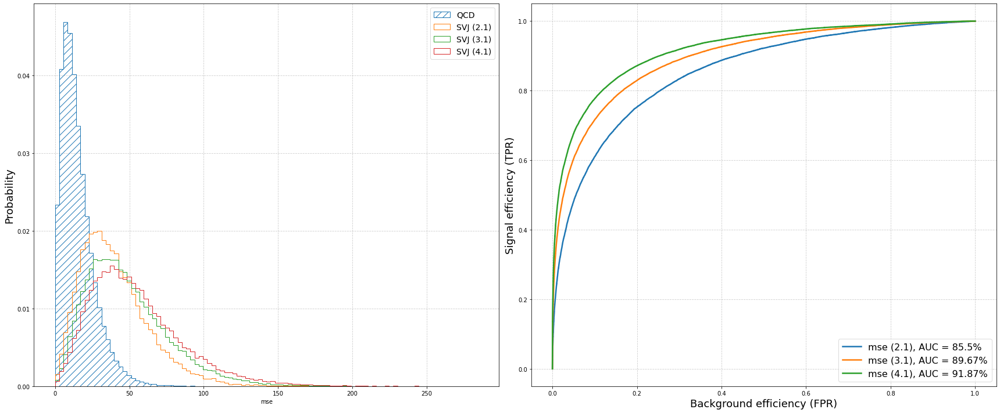

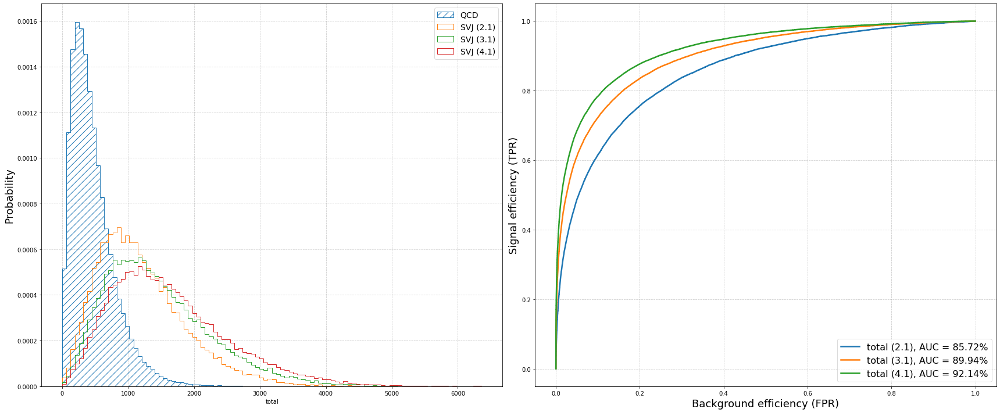

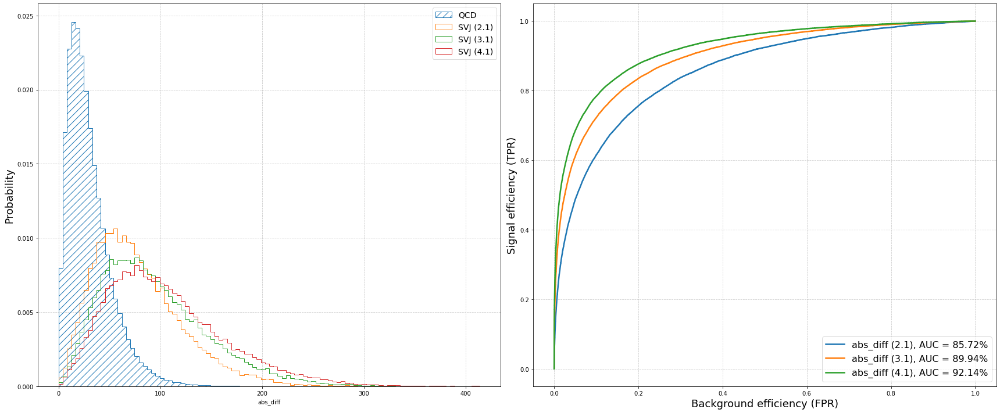

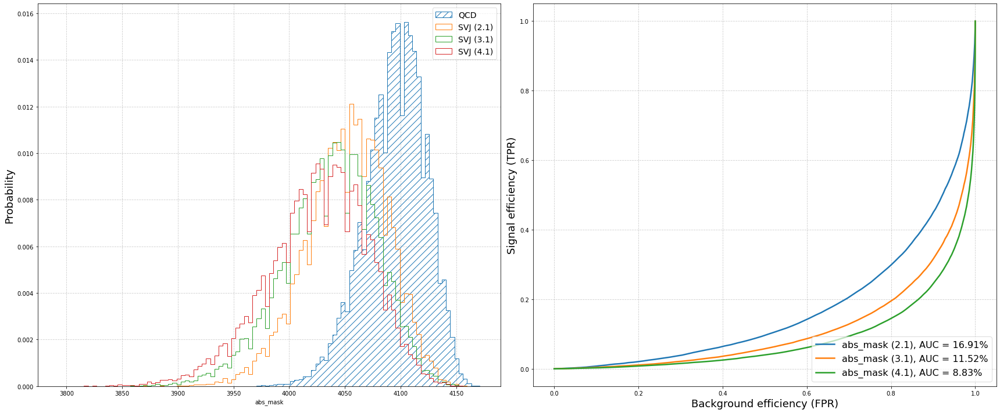

[abs_diff]    Avg: 89.26%, AUC: [85.72 89.94 92.14]
[total]       Avg: 89.26%, AUC: [85.72 89.94 92.14]
[bce]         Avg: 89.26%, AUC: [85.72 89.94 92.14]
[mse]         Avg: 89.01%, AUC: [85.5  89.67 91.87]
[dice]        Avg: 88.28%, AUC: [85.13 88.8  90.9 ]
[energy_pred] Avg: 87.66%, AUC: [83.36 88.52 91.09]
[hits_diff]   Avg: 87.58%, AUC: [83.09 88.48 91.17]
[hits_pred]   Avg: 50.0%, AUC: [50. 50. 50.]
[energy_diff] Avg: 43.3%, AUC: [35.78 42.95 51.16]
[abs_mask]    Avg: 12.42%, AUC: [16.91 11.52  8.83]
[bce]         Avg: 1.63%, FPR@40: [3.0467, 1.2142, 0.6365]
[total]       Avg: 1.63%, FPR@40: [3.0467, 1.2142, 0.6365]
[abs_diff]    Avg: 1.63%, FPR@40: [3.0473, 1.2148, 0.6365]
[mse]         Avg: 1.71%, FPR@40: [3.1578, 1.2783, 0.6882]
[dice]        Avg: 1.76%, FPR@40: [2.9991, 1.4293, 0.8545]
[energy_pred] Avg: 2.2%, FPR@40: [4.1968, 1.625, 0.7758]
[hits_diff]   Avg: 2.21%, FPR@40: [4.3535, 1.5787, 0.6955]
[hits_pred]   Avg: 40.0%, FPR@40: [40.0, 40.0, 40.0]
[energy_diff] Avg: 48.4%

In [11]:
scores = ad.eval2.anomaly_scores(model, x=x_mask, y=y_test, m=m_test)

roc1 = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['suep'])
ad.eval2.print_by_auc(roc1)
ad.eval2.print_fpr_at_n_tpr(roc1)

roc2 = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['svj'])
ad.eval2.print_by_auc(roc2)
ad.eval2.print_fpr_at_n_tpr(roc2)

Profile: measure inference time on cpu

In [12]:
# test sample
with tf.device('cpu'):
    x = tf.convert_to_tensor(x_mask[0][np.newaxis, ...])
    z = model.encoder2(x)

x.shape

TensorShape([1, 72, 58, 1])

In [21]:
# @tf.function
def profile_encoder(x: tf.Tensor):
    with tf.device('cpu'):
        return model.encoder2(x)

# @tf.function
def profile_full(x: tf.Tensor, z: tf.Tensor):
    with tf.device('cpu'):
        h = model.encoder1(x)
        return model.decoder([h, z])

In [22]:
%timeit profile_encoder(x)
%timeit profile_full(x, z)

24.1 ms ± 6.68 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
128 ms ± 4.95 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [24]:
ad.eval2.profile(model, data=x_mask[0][np.newaxis, ...], profiler_path='profile/codae')

warm-up done.
start profiling..
end profiling.


Discrete and Conditional Dual-VAE (CoD2VAE)

In [15]:
vae = COD2VAE(image_shape=(72, 58, 1), latent_size=64, tau=1.0,
              large_encoder=dict(depths=(1, 1, 1, 1), filters=[64, 128, 128, 256],
                                 groups=4),
              mask_encoder=dict(filters=[64, 128, 128, 256], groups=2),
              decoder=dict(filters=[256, 128, 128, 64], depths=(1, 1, 1, 1),
                           bias=-1.0, groups=4))

utils.load_from_checkpoint(vae, path='categorical_codvae', mode='max')

Loaded from "weights\categorical_codvae\weights-100-0.766"


In [12]:
z = vae.mask_encoder.predict(x_mask, batch_size=256)
z_l2 = tf.math.l2_normalize(z, axis=-1).numpy()

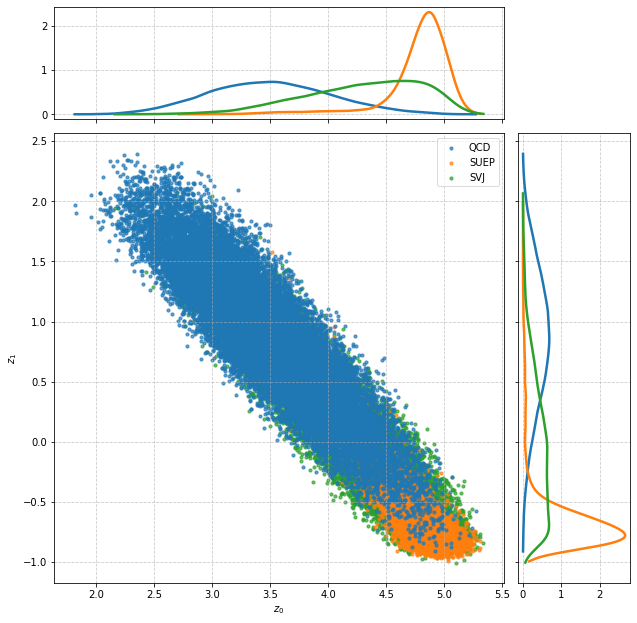

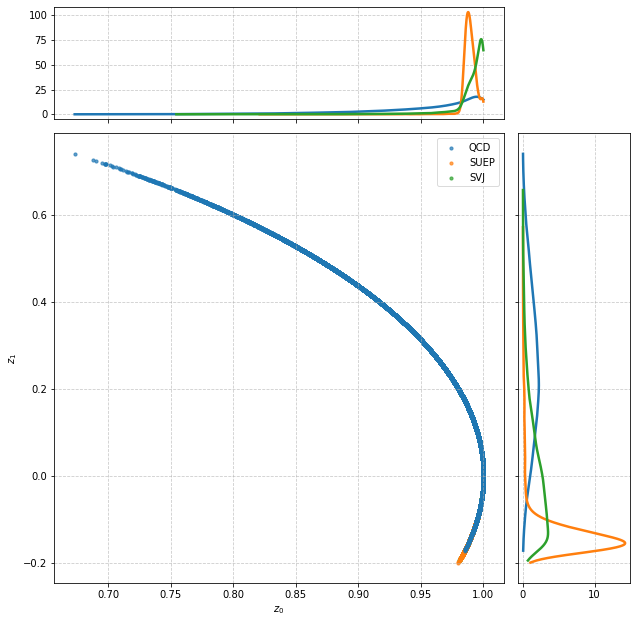

In [19]:
ad.plot.latent_kde(z, y=y_test)
ad.plot.latent_kde(z_l2, y=y_test)

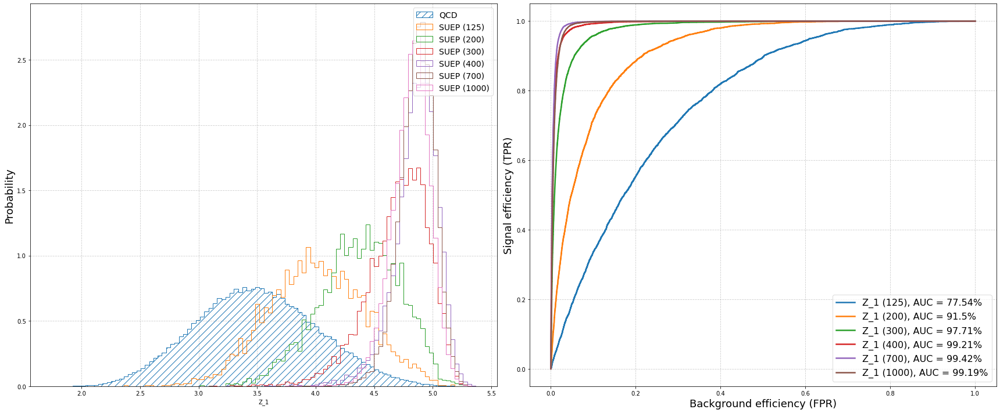

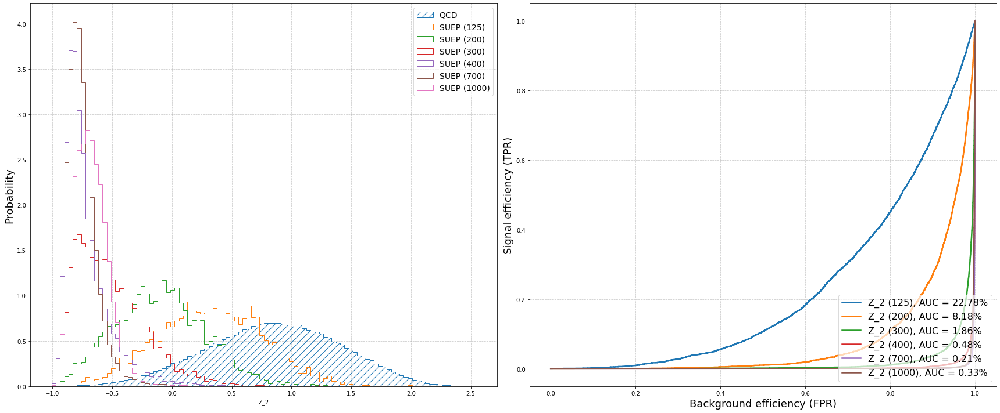

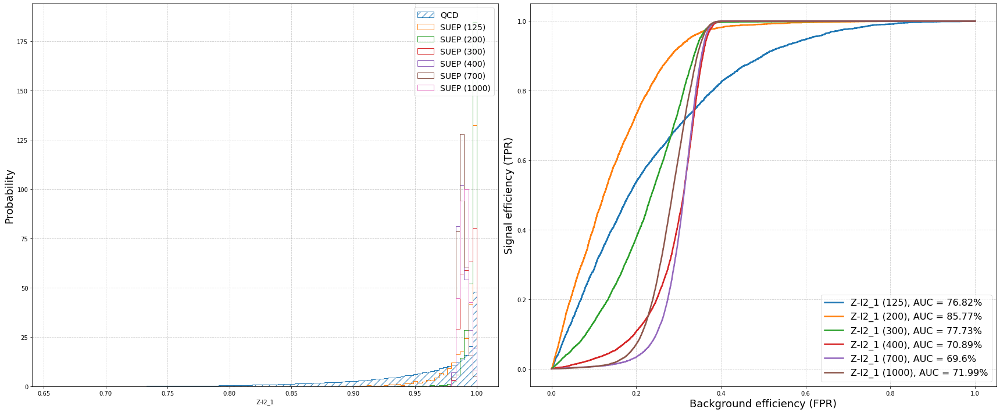

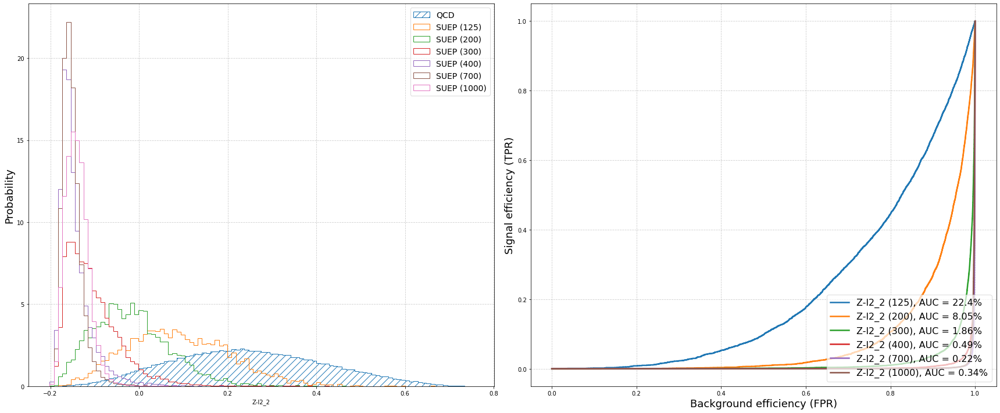

[Z_1]    Avg: 94.1%, AUC: [77.54 91.5  97.71 99.21 99.42 99.19]
[Z-l2_1] Avg: 75.47%, AUC: [76.82 85.77 77.73 70.89 69.6  71.99]
[Z_2]    Avg: 5.64%, AUC: [22.78  8.18  1.86  0.48  0.21  0.33]
[Z-l2_2] Avg: 5.56%, AUC: [22.4   8.05  1.86  0.49  0.22  0.34]
[Z_1]    Avg: 2.93%, FPR@40: [12.9126, 3.3294, 0.5754, 0.2186, 0.2269, 0.3415]
[Z-l2_1] Avg: 21.94%, FPR@40: [14.1572, 9.7836, 20.742, 29.59, 30.2136, 27.1307]
[Z_2]    Avg: 94.87%, FPR@40: [76.846, 93.5934, 99.2742, 99.8742, 99.8872, 99.7714]
[Z-l2_2] Avg: 94.94%, FPR@40: [77.3262, 93.594, 99.2183, 99.856, 99.876, 99.762]


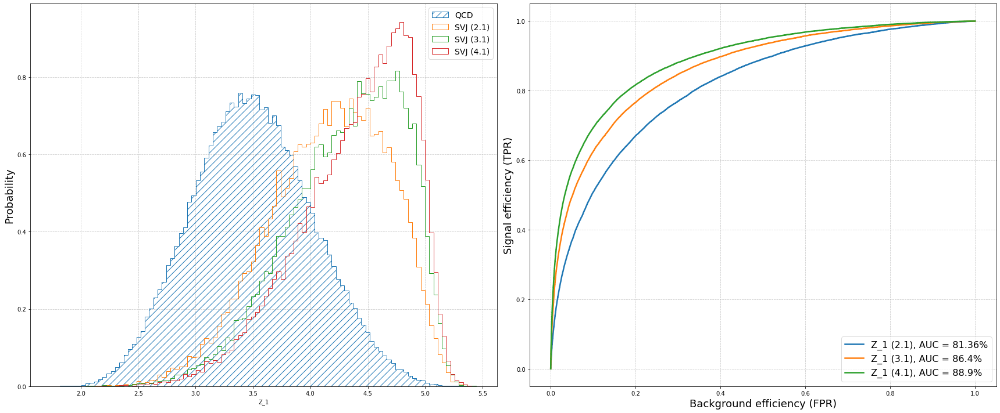

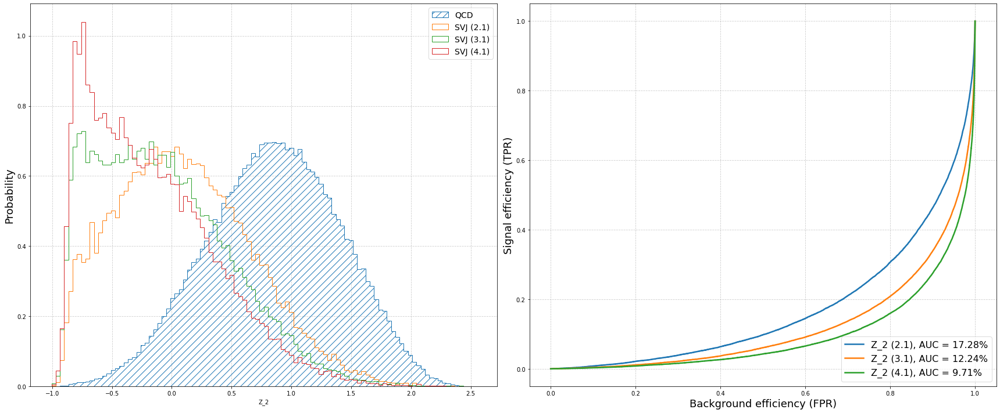

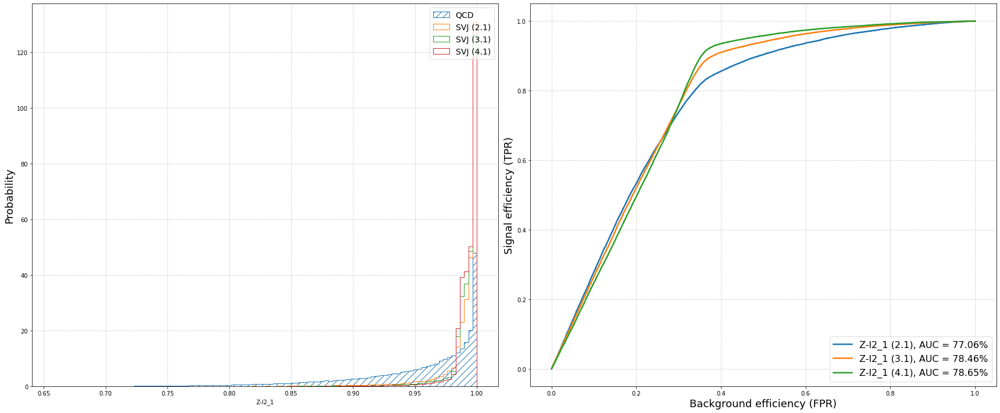

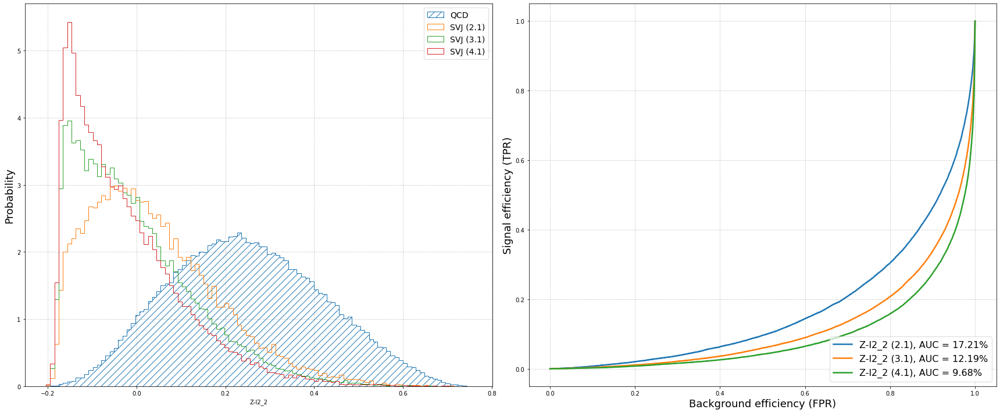

[Z_1]    Avg: 85.55%, AUC: [81.36 86.4  88.9 ]
[Z-l2_1] Avg: 78.06%, AUC: [77.06 78.46 78.65]
[Z_2]    Avg: 13.08%, AUC: [17.28 12.24  9.71]
[Z-l2_2] Avg: 13.03%, AUC: [17.21 12.19  9.68]
[Z_1]    Avg: 3.54%, FPR@40: [5.9, 2.8657, 1.8495]
[Z-l2_1] Avg: 15.3%, FPR@40: [14.5369, 15.1729, 16.2008]
[Z_2]    Avg: 91.62%, FPR@40: [86.5697, 92.9058, 95.3924]
[Z-l2_2] Avg: 91.66%, FPR@40: [86.6942, 92.9028, 95.373]


In [20]:
scores = ad.eval2.latents_as_scores({'Z': z, 'Z-l2': z_l2}, y=y_test, masses=m_test)

roc = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['suep'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

roc = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['svj'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

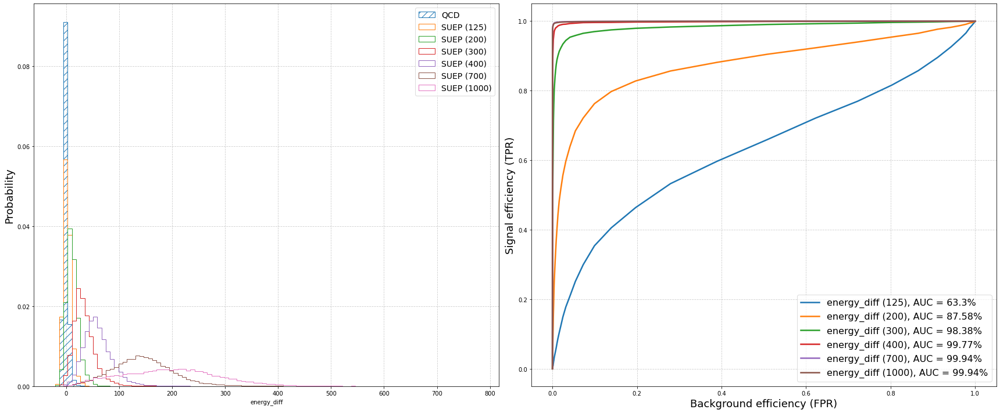

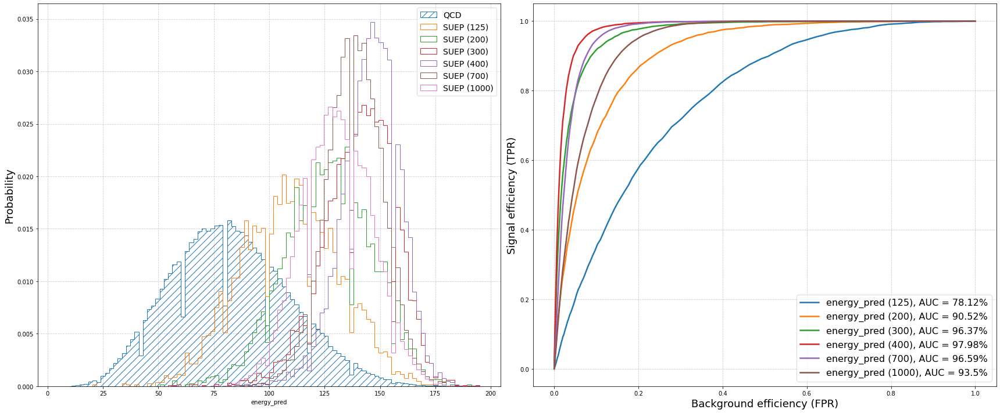

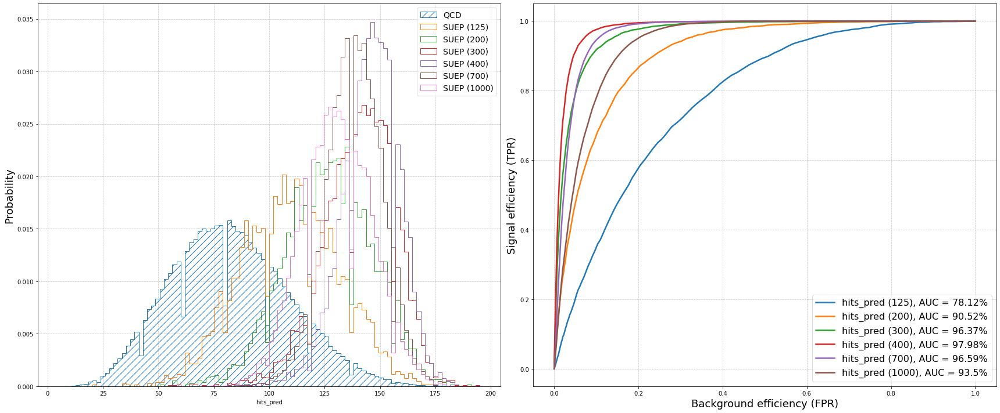

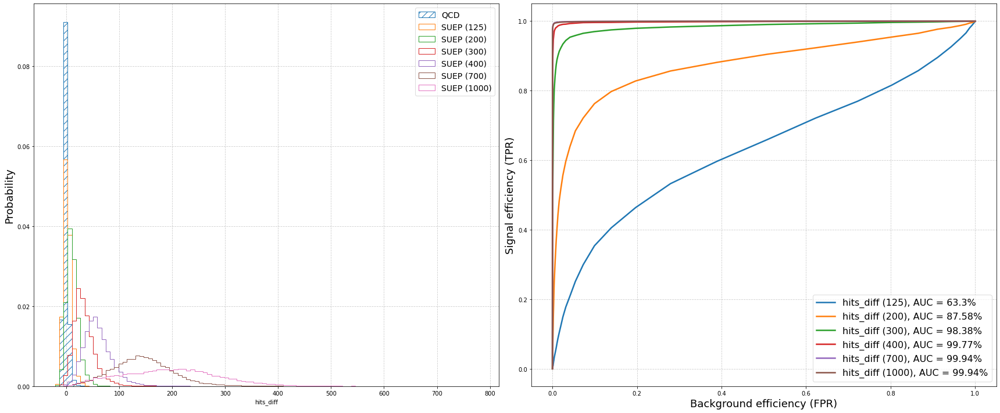

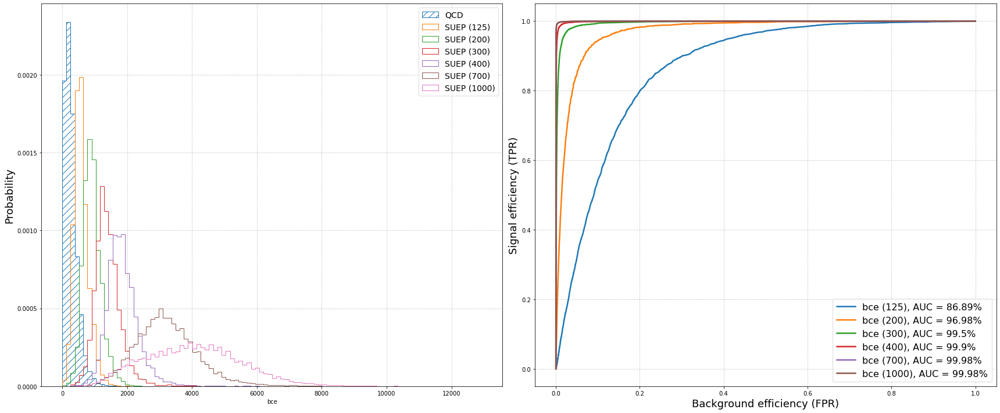

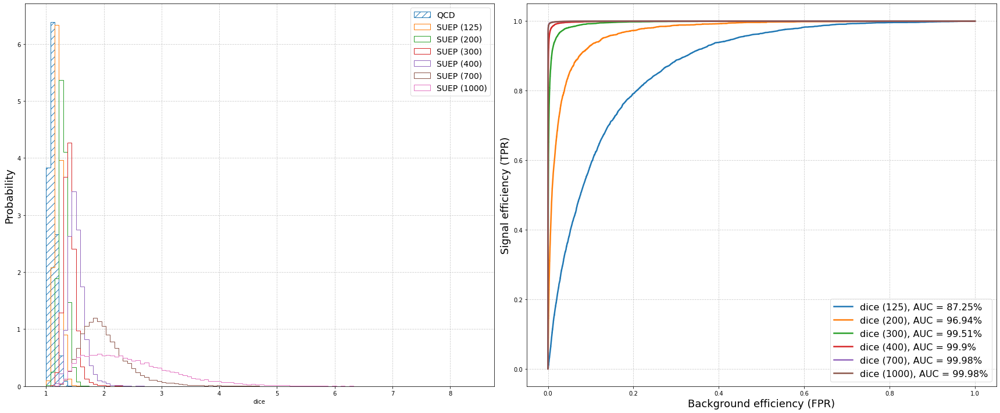

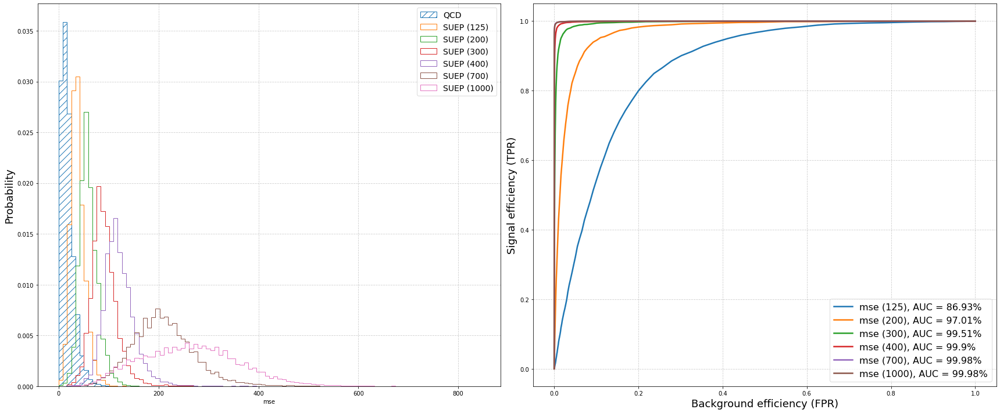

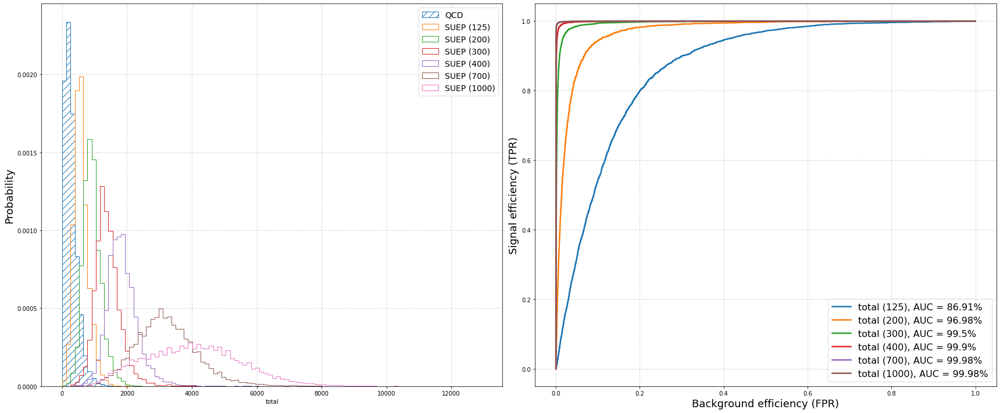

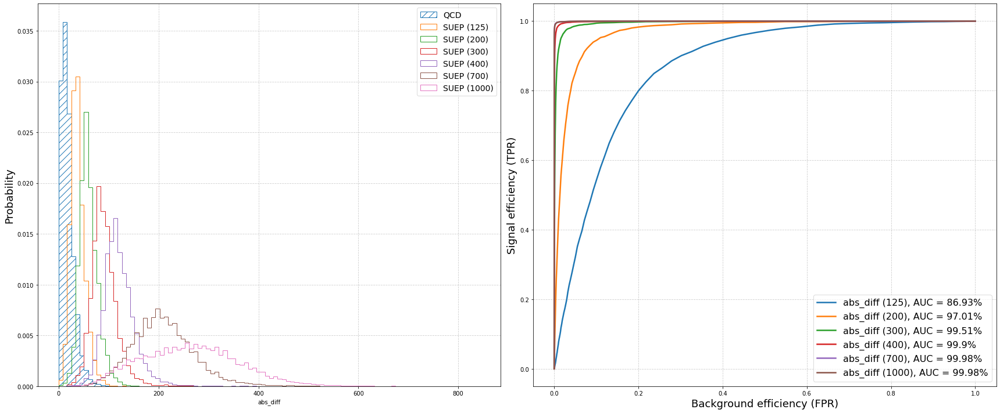

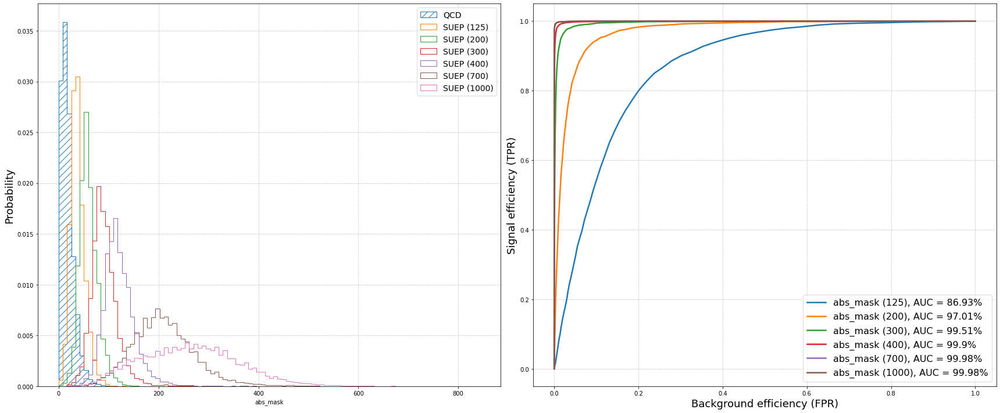

[dice]        Avg: 97.26%, AUC: [87.25 96.94 99.51 99.9  99.98 99.98]
[mse]         Avg: 97.22%, AUC: [86.93 97.01 99.51 99.9  99.98 99.98]
[abs_mask]    Avg: 97.22%, AUC: [86.93 97.01 99.51 99.9  99.98 99.98]
[abs_diff]    Avg: 97.22%, AUC: [86.93 97.01 99.51 99.9  99.98 99.98]
[total]       Avg: 97.21%, AUC: [86.91 96.98 99.5  99.9  99.98 99.98]
[bce]         Avg: 97.21%, AUC: [86.89 96.98 99.5  99.9  99.98 99.98]
[hits_pred]   Avg: 92.18%, AUC: [78.12 90.52 96.37 97.98 96.59 93.5 ]
[energy_pred] Avg: 92.18%, AUC: [78.12 90.52 96.37 97.98 96.59 93.5 ]
[hits_diff]   Avg: 91.49%, AUC: [63.3  87.58 98.38 99.77 99.94 99.94]
[energy_diff] Avg: 91.49%, AUC: [63.3  87.58 98.38 99.77 99.94 99.94]
[dice]        Avg: 0.98%, FPR@40: [5.2522, 0.6031, 0.0335, 0.0041, 0.0, 0.0]
[abs_diff]    Avg: 1.28%, FPR@40: [6.6522, 0.9435, 0.071, 0.0068, 0.0, 0.0]
[abs_mask]    Avg: 1.28%, FPR@40: [6.6522, 0.9435, 0.071, 0.0068, 0.0, 0.0]
[mse]         Avg: 1.28%, FPR@40: [6.6522, 0.9435, 0.071, 0.0068, 0.0, 

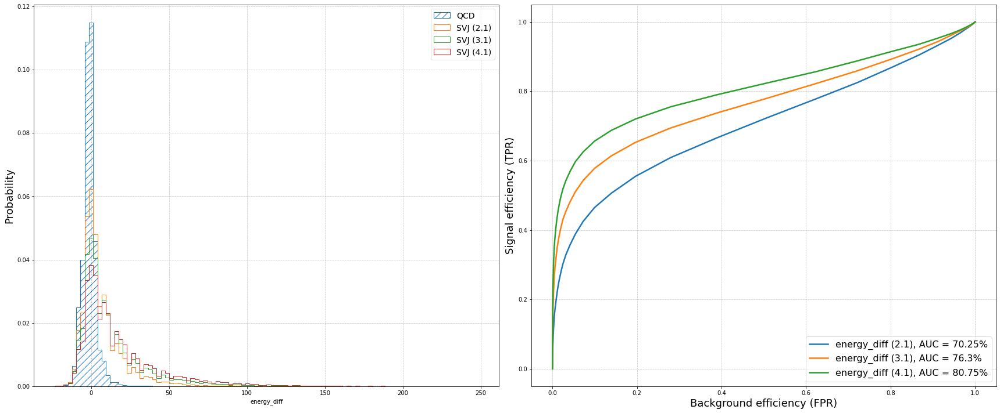

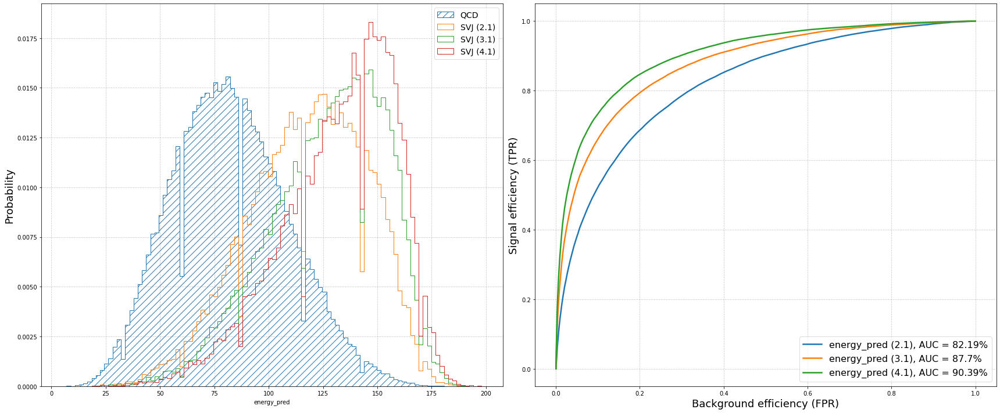

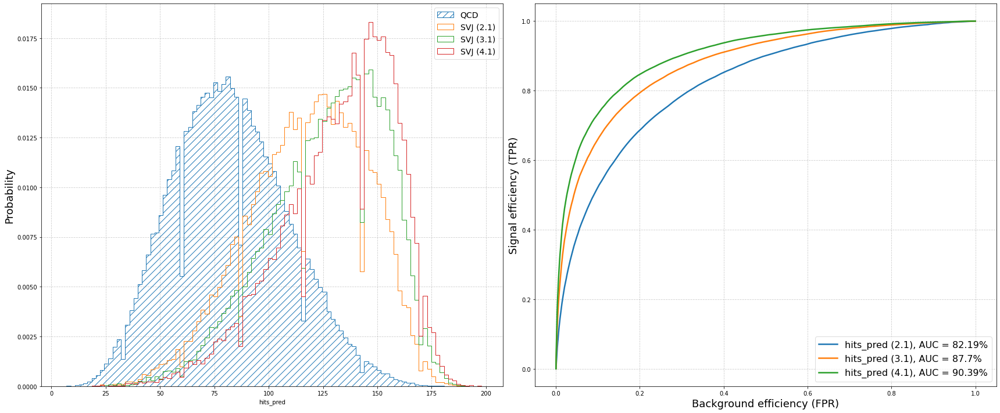

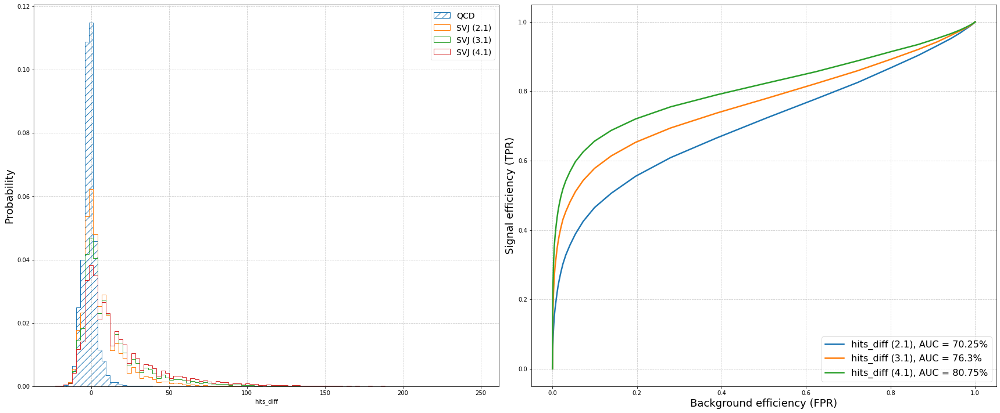

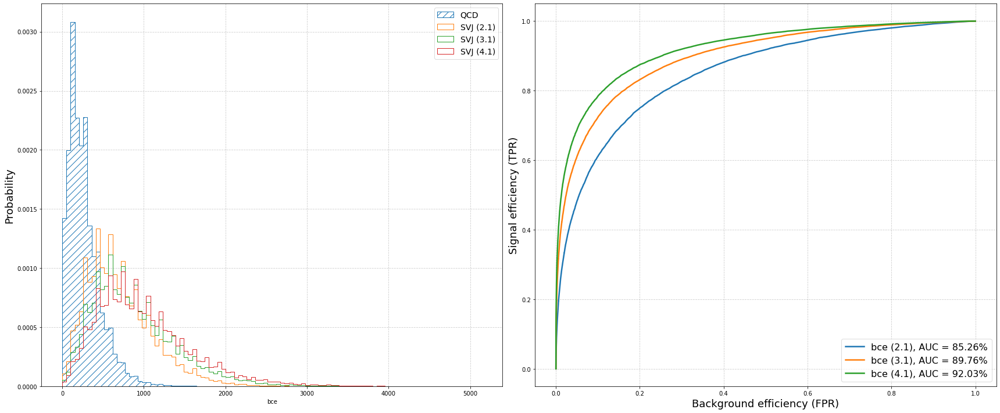

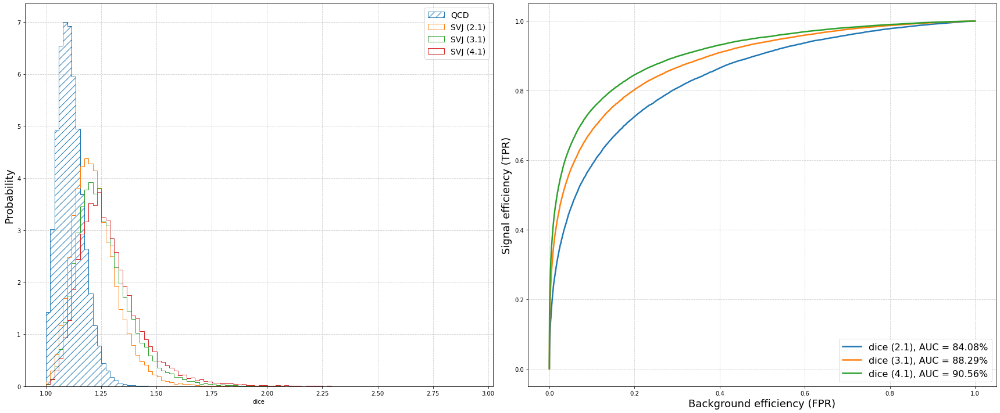

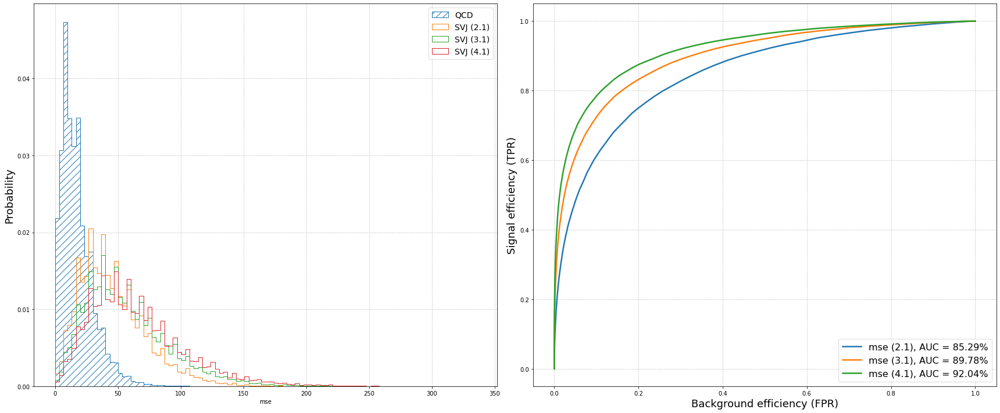

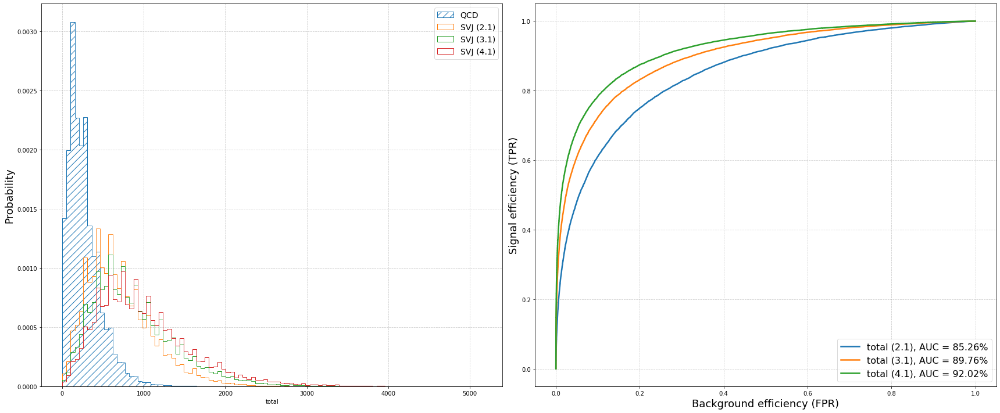

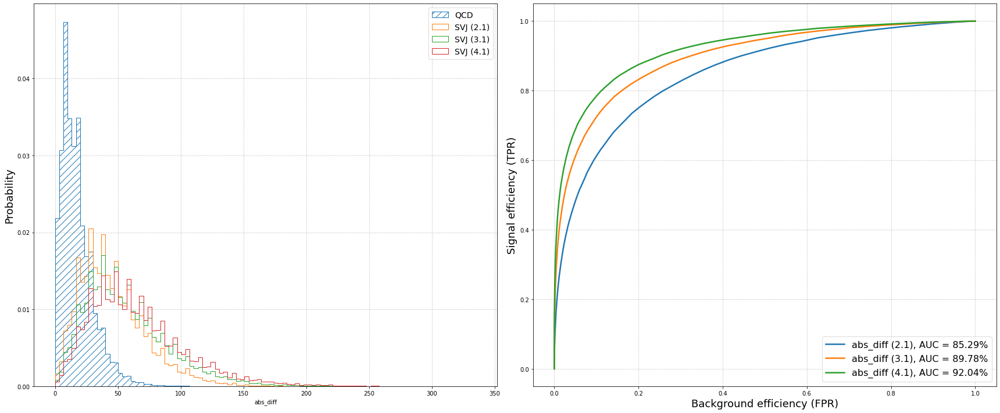

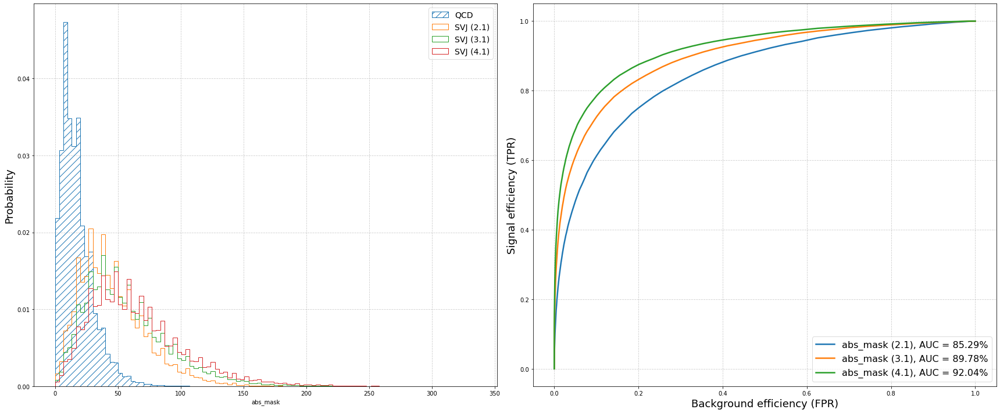

[mse]         Avg: 89.04%, AUC: [85.29 89.78 92.04]
[abs_mask]    Avg: 89.04%, AUC: [85.29 89.78 92.04]
[abs_diff]    Avg: 89.04%, AUC: [85.29 89.78 92.04]
[bce]         Avg: 89.02%, AUC: [85.26 89.76 92.03]
[total]       Avg: 89.02%, AUC: [85.26 89.76 92.02]
[dice]        Avg: 87.64%, AUC: [84.08 88.29 90.56]
[hits_pred]   Avg: 86.76%, AUC: [82.19 87.7  90.39]
[energy_pred] Avg: 86.76%, AUC: [82.19 87.7  90.39]
[hits_diff]   Avg: 75.77%, AUC: [70.25 76.3  80.75]
[energy_diff] Avg: 75.77%, AUC: [70.25 76.3  80.75]
[abs_diff]    Avg: 1.61%, FPR@40: [3.0648, 1.1755, 0.5879]
[abs_mask]    Avg: 1.61%, FPR@40: [3.0648, 1.1755, 0.5879]
[mse]         Avg: 1.61%, FPR@40: [3.0648, 1.1755, 0.5879]
[total]       Avg: 1.61%, FPR@40: [3.0671, 1.1778, 0.5901]
[bce]         Avg: 1.61%, FPR@40: [3.0734, 1.1774, 0.5903]
[dice]        Avg: 1.92%, FPR@40: [3.463, 1.502, 0.8099]
[energy_diff] Avg: 2.88%, FPR@40: [6.0057, 1.8722, 0.7599]
[hits_diff]   Avg: 2.88%, FPR@40: [6.0057, 1.8722, 0.7599]
[energy_pr

In [13]:
scores = ad.eval2.anomaly_scores(vae, x=x_mask, y=y_test, m=m_test)

roc1 = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['suep'])
ad.eval2.print_by_auc(roc1)
ad.eval2.print_fpr_at_n_tpr(roc1)

roc2 = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['svj'])
ad.eval2.print_by_auc(roc2)
ad.eval2.print_fpr_at_n_tpr(roc2)

Information-theoretic scores

In [13]:
from tqdm import tqdm

In [23]:
@tf.function
def reverse_kl(batch: tf.Tensor, num=10) -> tf.Tensor:
    # https://github.com/tensorflow/probability/blob/0759c57eb0306a5bb0fcc3d105bbcab9943092a5/tensorflow_probability/python/layers/distribution_layer.py#L1339
    z, _ = vae.energy_encoder(batch)
    test_points = z.sample(num)

    kl = z.log_prob(test_points) - vae.prior.log_prob(test_points)  # rank-4 NxBxZ1xZ2
    kl = tf.reduce_sum(kl, axis=(2, 3))  # sum over latent sizes
    kl = tf.reduce_mean(kl, axis=0)  # average over number of samples points (N)
    return tf.reshape(kl, shape=(-1, 1))  # reshape as (B, 1)


@tf.function
def forward_kl(batch: tf.Tensor, num=10) -> tf.Tensor:
    z, _ = vae.energy_encoder(batch)
    test_points = vae.prior.sample(num * len(batch))
    test_points = tf.reshape(test_points, shape=(num, -1) + vae.latent_shape)

    kl = vae.prior.log_prob(test_points) - z.log_prob(test_points)   # rank-4 NxBxZ1xZ2
    kl = tf.reduce_sum(kl, axis=(2, 3))  # sum over latent sizes
    kl = tf.reduce_mean(kl, axis=0)  # average over number of samples points (N)
    return tf.reshape(kl, shape=(-1, 1))  # reshape as (B, 1)


In [24]:
ds = tf.data.Dataset.from_tensor_slices(x_mask).batch(256)
kl_f = []
kl_r = []

In [25]:
for batch in tqdm(ds):
    kl_r.append(reverse_kl(batch))
    kl_f.append(forward_kl(batch))

kl_r = np.concatenate(kl_r)
kl_f = np.concatenate(kl_f)
kl_r.shape

100%|██████████| 1343/1343 [01:45<00:00, 12.79it/s]


(343769, 1)

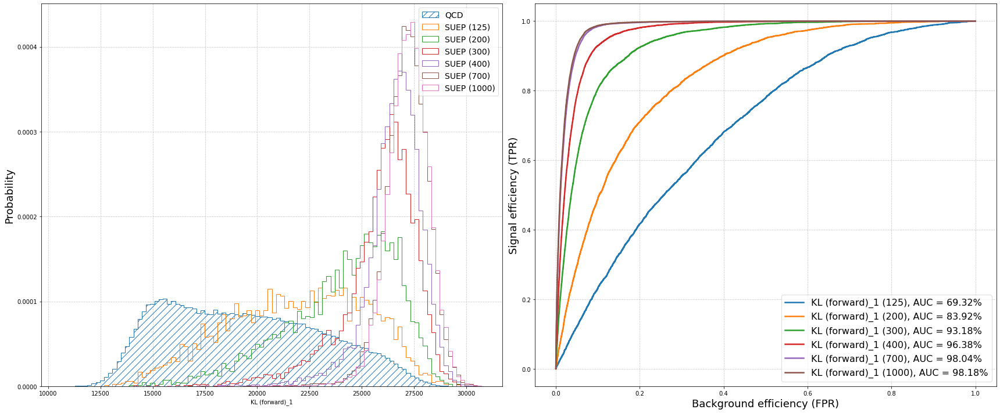

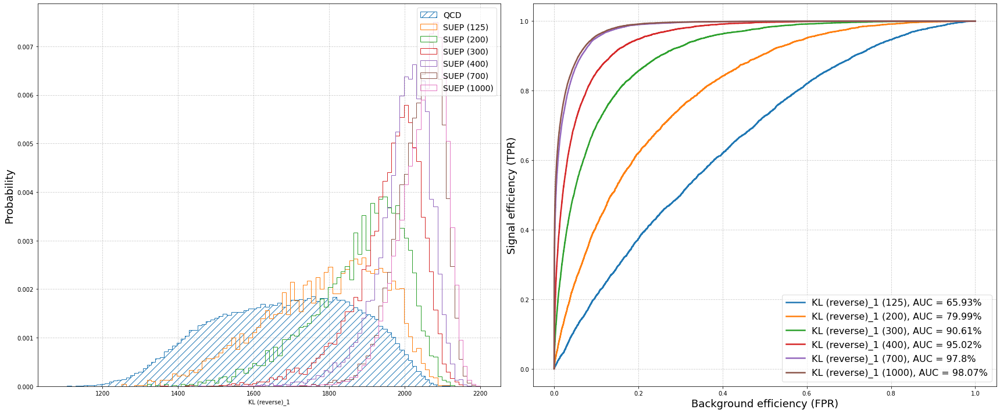

[KL (forward)_1] Avg: 89.84%, AUC: [69.32 83.92 93.18 96.38 98.04 98.18]
[KL (reverse)_1] Avg: 87.9%, AUC: [65.93 79.99 90.61 95.02 97.8  98.07]
[KL (forward)_1] Avg: 5.35%, FPR@40: [19.0753, 7.498, 2.6353, 1.4516, 0.7393, 0.677]
[KL (reverse)_1] Avg: 5.98%, FPR@40: [21.7576, 9.6061, 3.0191, 1.2183, 0.1816, 0.0976]


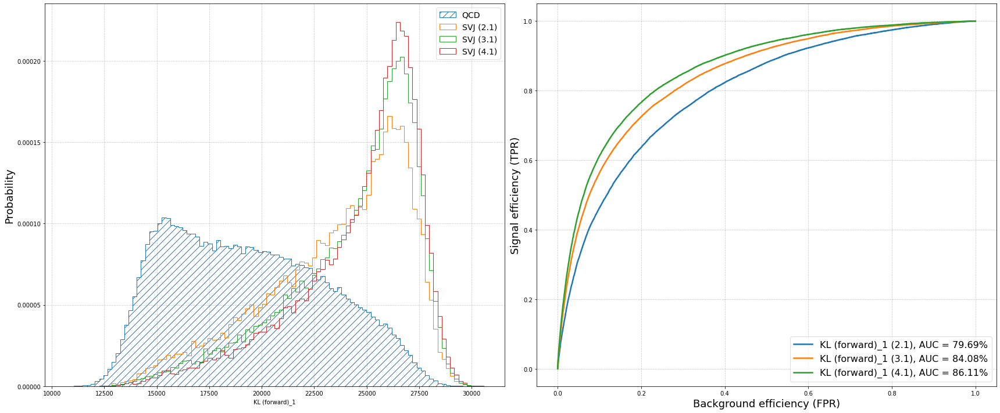

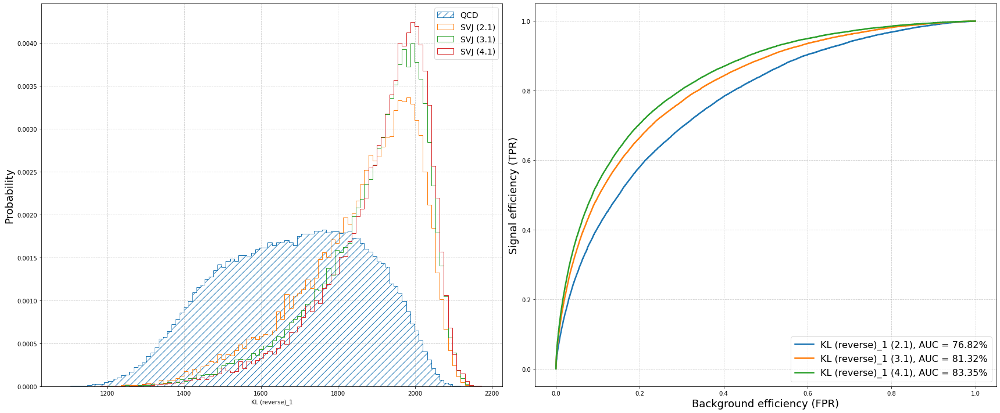

[KL (forward)_1] Avg: 83.3%, AUC: [79.69 84.08 86.11]
[KL (reverse)_1] Avg: 80.5%, AUC: [76.82 81.32 83.35]
[KL (forward)_1] Avg: 5.47%, FPR@40: [7.4251, 4.9133, 4.0846]
[KL (reverse)_1] Avg: 7.28%, FPR@40: [9.696, 6.6023, 5.5421]


In [26]:
kl_scores = ad.eval2.latents_as_scores({'KL (forward)': kl_f, 'KL (reverse)': kl_r},
                                       y=y_test, masses=m_test)

roc = ad.plot.roc_per_mass(bkg_scores=kl_scores['qcd'], signal_scores=kl_scores['suep'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

roc = ad.plot.roc_per_mass(bkg_scores=kl_scores['qcd'], signal_scores=kl_scores['svj'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

Profile

In [30]:
def profile_encoder(x: tf.Tensor):
    with tf.device('cpu'):
        return vae.mask_encoder(x)

def profile_full(x: tf.Tensor, z: tf.Tensor):
    with tf.device('cpu'):
        h, _ = vae.energy_encoder(x)
        return vae.decoder([h, z])

In [36]:
%timeit profile_encoder(x)
%timeit profile_full(x, z)

20.4 ms ± 338 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
177 ms ± 4.64 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [26]:
ad.eval2.profile(vae, data=x_mask[0][np.newaxis, ...], profiler_path='profile/cat_codvae')

warm-up done.
start profiling..
end profiling.


---
Supervised Model

In [16]:
from ad.models import get_cct

In [22]:
model = get_cct(num_classes=3, input_shape=(72, 58, 1), num_heads=2,
                dropout=0.2, stochastic_depth_rate=0.2,
                projection_dim=128, transformer_units=[128, 128])

utils.load_from_checkpoint(model, path='supervised-cct', mode='max')

Loaded from "weights\supervised-cct\weights-21-0.988"


In [24]:
# prepare the data for the supervised model
x_test = ad.constants.clip(data['images'])
x_test = np.sum(x_test, axis=-1, keepdims=True)
utils.free_mem()

0

In [11]:
with tf.device('cpu'):
    logits = model.predict(x_test, batch_size=128, verbose=1)

2686/2686 [==============================] - 1506s 561ms/step


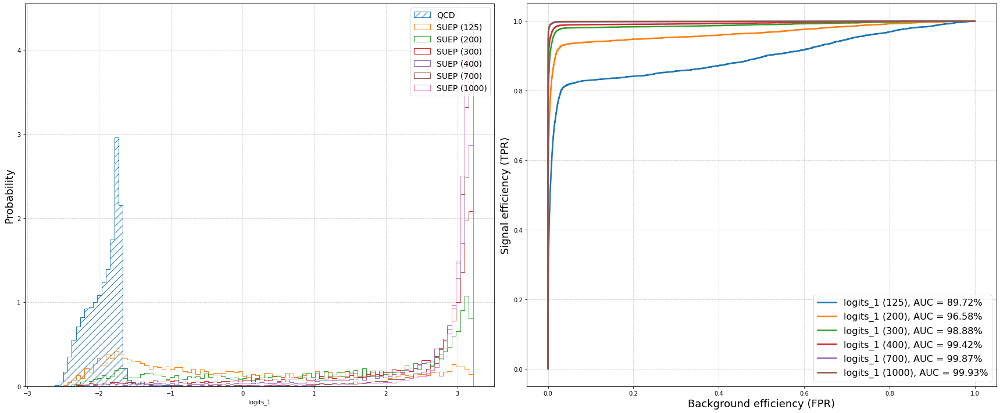

[logits_1] Avg: 97.4%, AUC: [89.72 96.58 98.88 99.42 99.87 99.93]
[logits_1] Avg: 0.04%, FPR@40: [0.2421, 0.0165, 0.0024, 0.0, 0.0, 0.0]


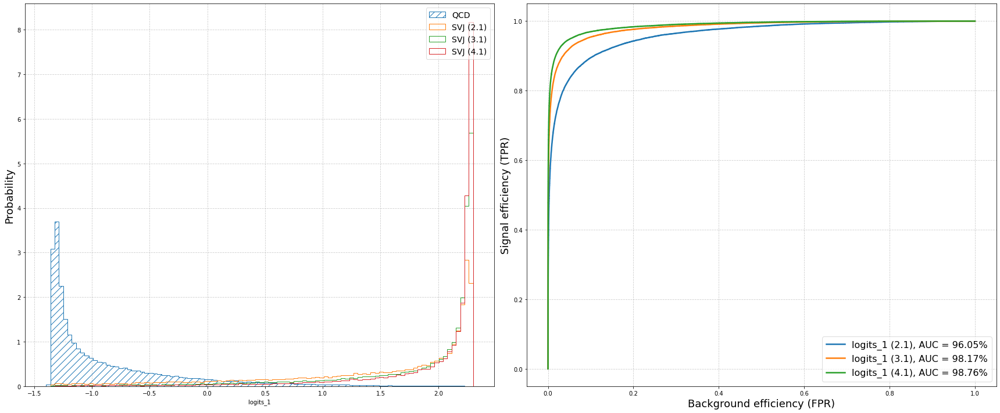

[logits_1] Avg: 97.66%, AUC: [96.05 98.17 98.76]
[logits_1] Avg: 0.05%, FPR@40: [0.1211, 0.0206, 0.0053]


In [12]:
scores = ad.eval2.latents_as_scores({'logits': logits[:, 1, np.newaxis]},
                                    y=data['labels'], masses=data['masses'])

roc = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['suep'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

scores = ad.eval2.latents_as_scores({'logits': logits[:, 2, np.newaxis]},
                                    y=data['labels'], masses=data['masses'])

roc = ad.plot.roc_per_mass(bkg_scores=scores['qcd'], signal_scores=scores['svj'])
ad.eval2.print_by_auc(roc)
ad.eval2.print_fpr_at_n_tpr(roc)

---
Visualize original dataset events

In [7]:
import h5py
import random

In [64]:
def show_events(folder: str, num: int, base_path='data/n_tracks', **kwargs):
    # list files
    files = os.listdir(os.path.join(base_path, folder))
    random.shuffle(files)

    path = os.path.join(base_path, folder, files[0])
    print(f'reading "{path}"')

    with h5py.File(path, mode='r') as file:
        image_trk = np.array(file.get('ImageTrk_PUcorr'),
                             dtype=np.float32)[..., None].transpose((0, 2, 1, 3))

        image_ecal = np.array(file.get('ImageECAL'),
                              dtype=np.float32)[..., None].transpose((0, 2, 1, 3))

        image_hcal = np.array(file.get('ImageHCAL'),
                              dtype=np.float32)[..., None].transpose((0, 2, 1, 3))

        for _ in range(num):
            ad.plot.compare(image_trk, image_ecal, image_hcal,
                            title=['Trk', 'ECAL', 'HCAL'], **kwargs)


reading "../data/n_tracks\qcd\qcd_gensim_115_9.h5"
i: 379


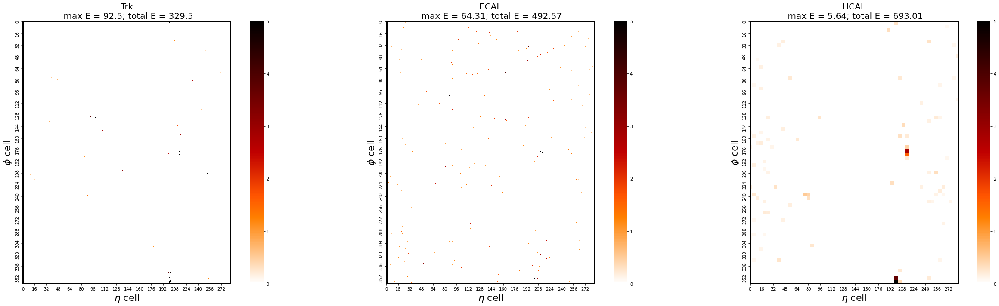

i: 492


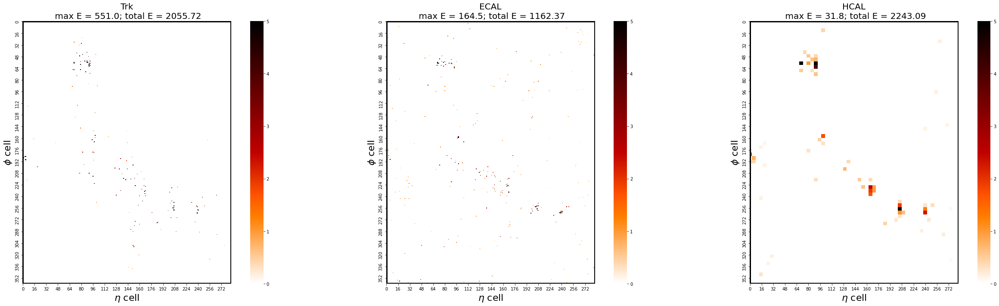

i: 40


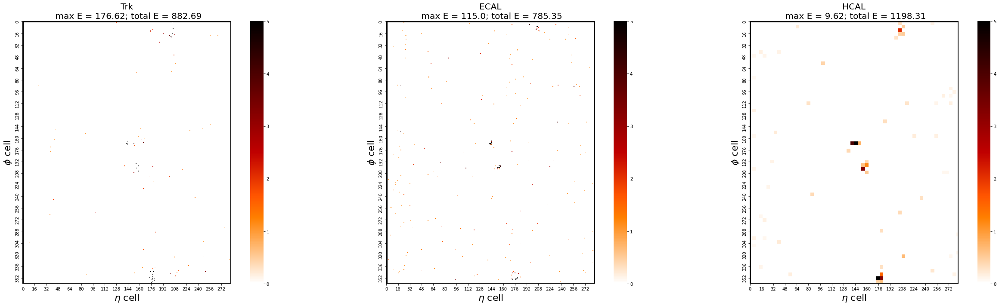

i: 156


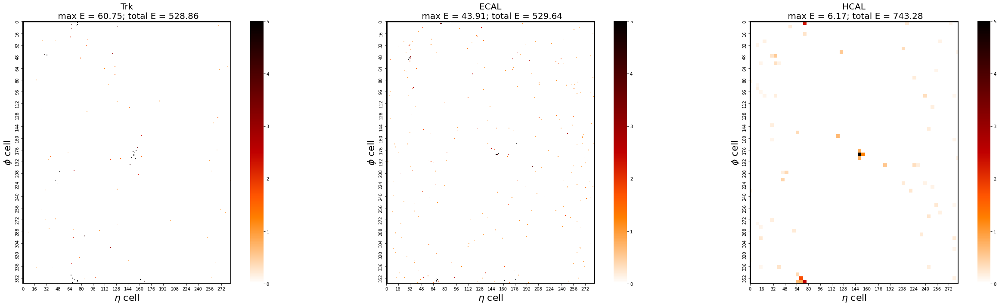

i: 14


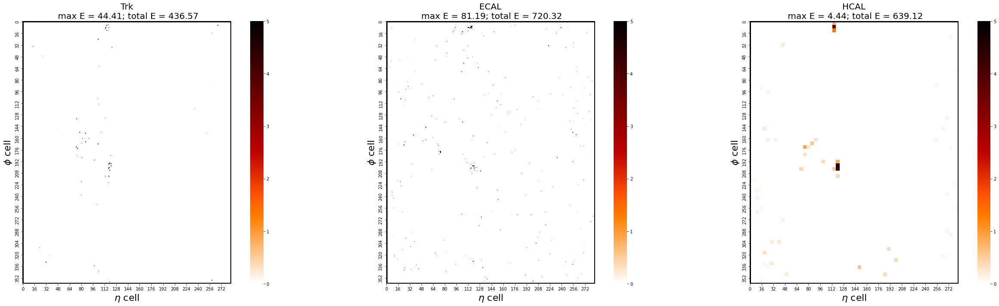

In [73]:
show_events(folder='qcd', num=5, v_max=5, square=True, border_width=5,
            yticklabels=16, xticklabels=16, fonts=dict(axis=22, title=20))

reading "../data/n_tracks\suep\suep_gensim_h400_phi2_dp0p7_dt2_110_8.h5"
i: 61


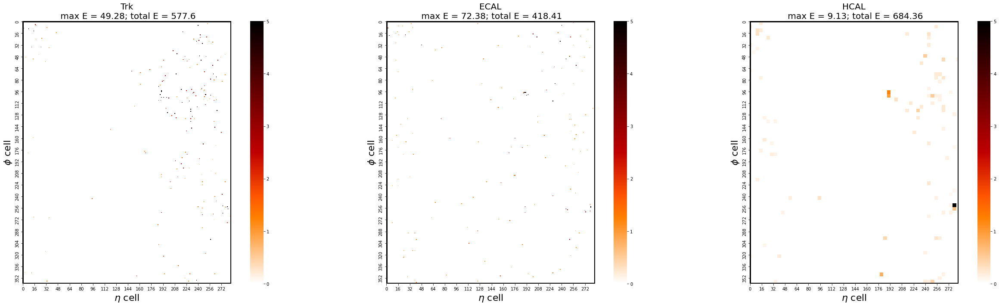

i: 39


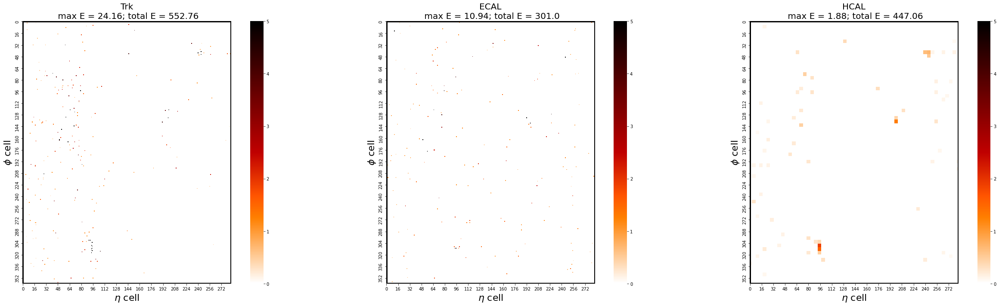

i: 84


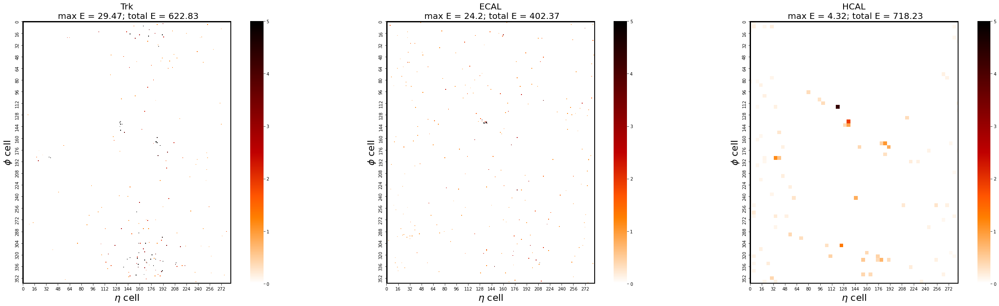

i: 79


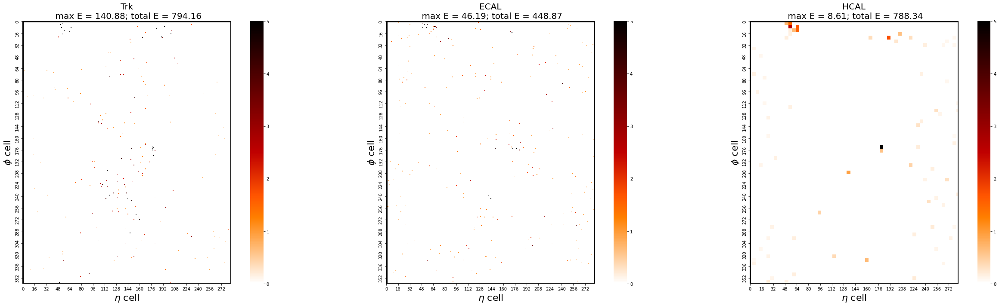

i: 81


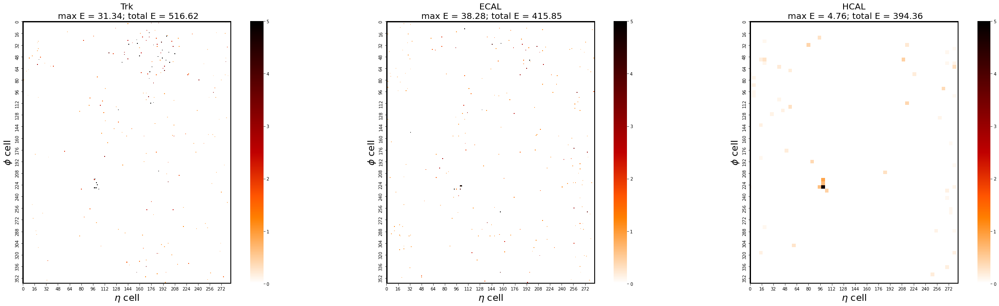

In [71]:
show_events(folder='suep', num=5, v_max=5, square=True, border_width=5,
            yticklabels=16, xticklabels=16, fonts=dict(axis=22, title=20))

reading "../data/n_tracks\svj\svj_3100_433829_7.h5"
i: 52


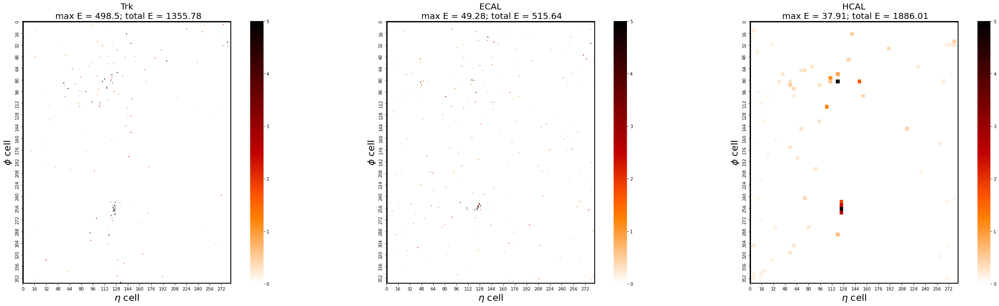

i: 23


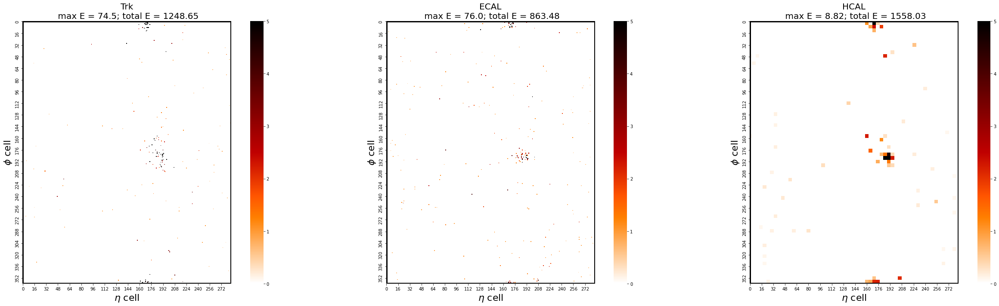

i: 25


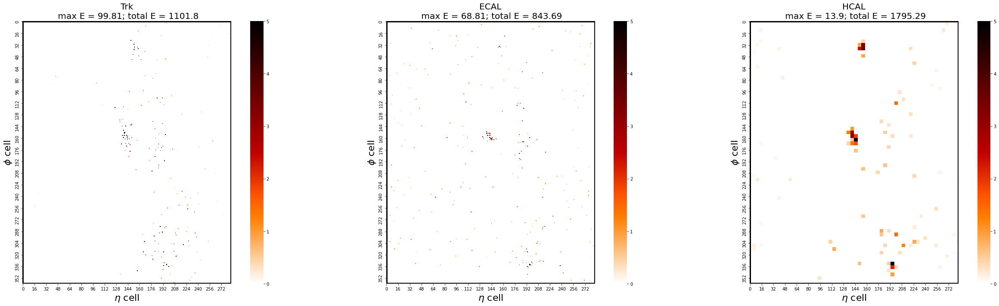

i: 88


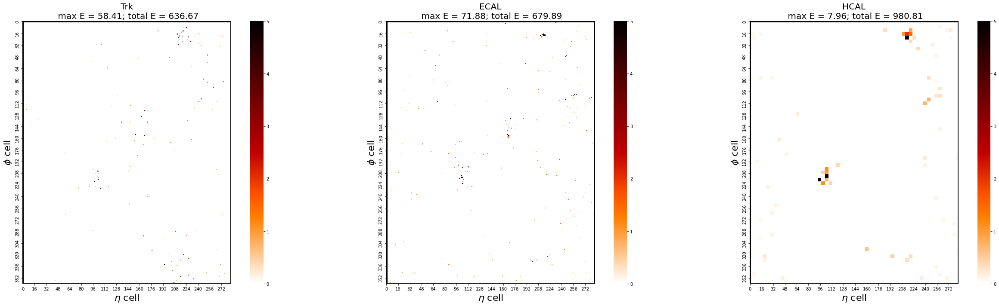

i: 59


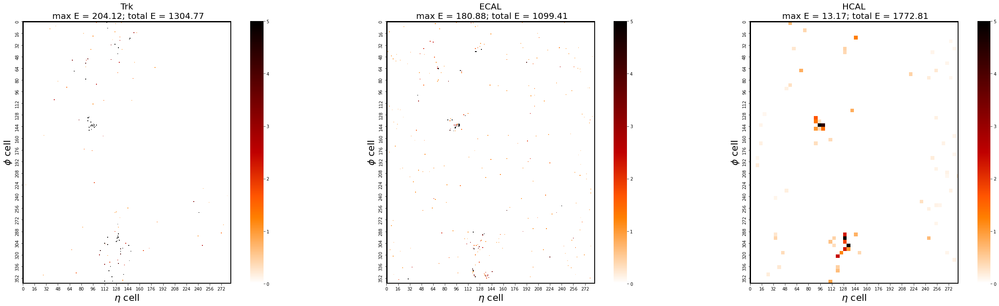

In [72]:
show_events(folder='svj', num=5, v_max=5, square=True, border_width=5,
            yticklabels=16, xticklabels=16, fonts=dict(axis=22, title=20))